In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'stanford-dogs-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F119698%2F791828%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240418%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240418T071246Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3Db365cb7e3a1256e0e345949df9da50304ac23883a323e2428092d434def53b48a6c65667f19c5a56f7a8a24fca5da45364dbb8579de5031c61befd8141e841acec4ca70d7b4cc9e1965f35e9e095dd3a2b400c72cc05e5bd09817f31baa64d60581148e5498436d3c17ca87f2bf0bddca75359b1297d0c4473724ae904e4579138c26a4360138b2b5032e082265b1aaad5f1c4950f0db32c7f2c5a19e2ff80dbcfda6201a99cf19942eacdc298d9ee7ee205fb4d787d497d8e7d4c31a7c4798bcc898d74f7888a56af8c77baabf5cbf6b128a5c6f076f3e8b7792ed6fece5b0bb4dade7f23eece51bc21f5ac28f1f6121895dae274f4ffab240ec07e882c026d'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


<br><br>
# Importing the libraries

In [ ]:
from __future__ import print_function
import time
import os
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
from skimage.transform import resize

import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### About the Dataset
We will be using Stanford Dogs dataset which contains images of 120 breeds of dogs from all over the world

Total dog pictures available: 120


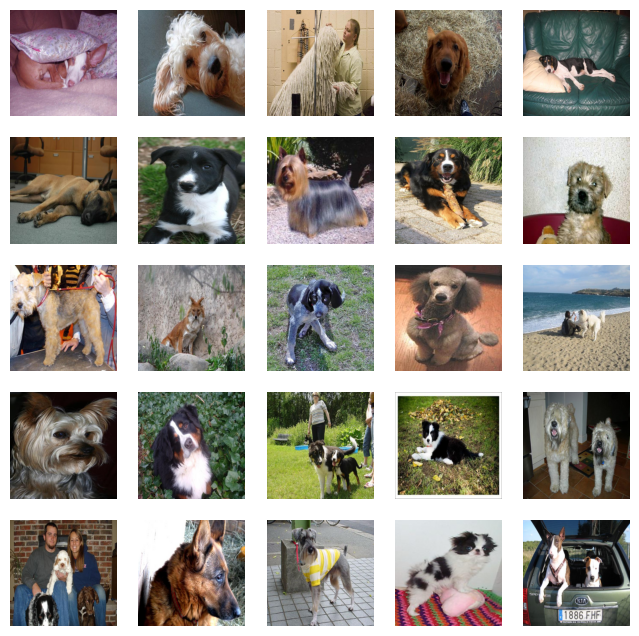

In [ ]:
import random
# Define the path to the directory containing dog images
PATH = '/kaggle/input/stanford-dogs-dataset/images/Images/'

# Get the list of image filenames in the directory
images = os.listdir(PATH)

# Display the count of dog pictures in the directory
print(f'Total dog pictures available: {len(os.listdir(PATH))}')

# Create subplots to display random images
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(8,8))

# Iterate through the subplots and display random dog images
for indx, axis in enumerate(axes.flatten()):
    PATH_TEMP = random.choice(os.listdir(PATH))
    # Get a random index within the range of available images
    rnd_indx = np.random.randint(0, len(os.listdir(PATH+'/'+PATH_TEMP)))

    # Load and display the image using Matplotlib
    images = os.listdir(PATH+'/'+PATH_TEMP+'/')
    img = plt.imread(PATH+'/'+PATH_TEMP + '/'+images[rnd_indx])
    # Resize the image to a constant size (e.g., 64x64)

    img = resize(img, (400,400))
    imgplot = axis.imshow(img)
    axis.set_axis_off()  # Turn off the axis for better visualization



# Image Preprocessing
We apply transformations to our images, resize them to 64x64 pixels, and apply random color jittering, rotation, and horizontal flipping. We convert these transformed images into tensors and normalize them. We load these images in batches of 32 from a folder and shuffle them for randomness. This approach enhances the diversity and size of our dataset, improving our model’s robustness.

In [ ]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder(PATH, transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

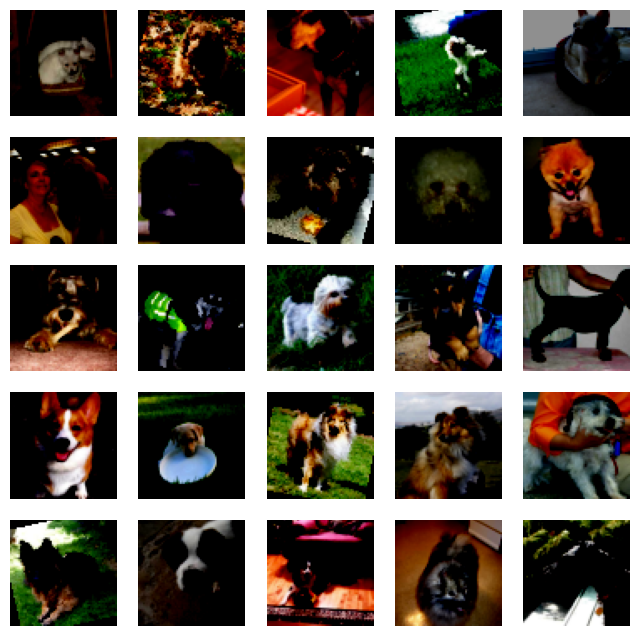

In [ ]:
fig, axs = plt.subplots(5,5, figsize = (8,8))

for i in range(5):
    for j in range(5):
        axs[i,j].imshow(imgs[5*i+j])
        axs[i,j].axis('off')

plt.show()

# Weights
### Defining the weights_init function

In [ ]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

# Generator

In [ ]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )

    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Discriminator

In [ ]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )

    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1)


# Creating the discriminator
netD = D()
netD.apply(weights_init)


D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

## Another setup

In [ ]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()

        self.nz = nz
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img


class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()

        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)

        return out.view(-1, 1)

# Training

In [ ]:
!mkdir results
!ls

results


### Parameters

In [ ]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Initialize models and optimizers

In [ ]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

**Plot Loss per EPOCH**
> plot_loss()

In [ ]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

**Show generated images**
> show_generated_img()

In [ ]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)

    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)

    plt.show()
    plt.close()

### Training Loop

[1/100][322/644] Loss_D: 1.1660 Loss_G: 1.3851 D(x): 0.5080 D(G(z)): 0.2988 / 0.2513
[1/100][644/644] Loss_D: 1.5342 Loss_G: 1.6963 D(x): 0.3360 D(G(z)): 0.3312 / 0.1594


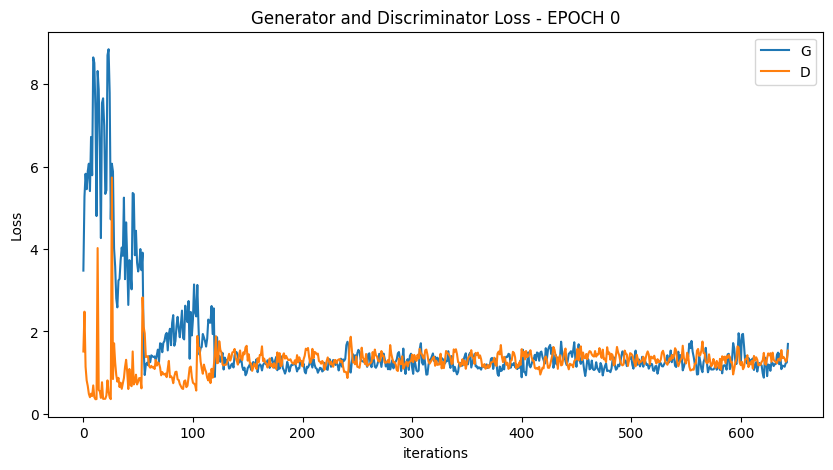

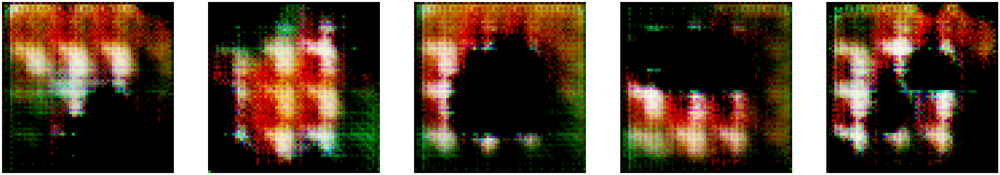

  0%|          | 0/644 [00:00<?, ?it/s]

[2/100][322/644] Loss_D: 1.4010 Loss_G: 2.0908 D(x): 0.4207 D(G(z)): 0.3525 / 0.1307
[2/100][644/644] Loss_D: 1.9724 Loss_G: 1.5102 D(x): 0.2223 D(G(z)): 0.3888 / 0.2019


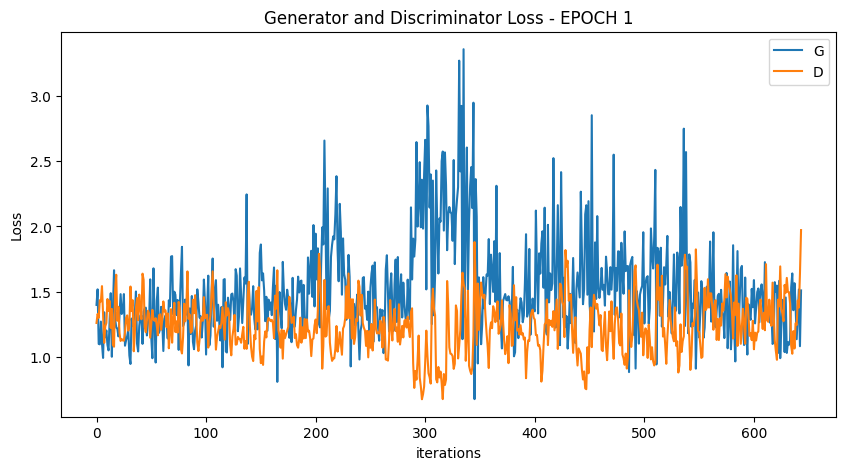

  0%|          | 0/644 [00:00<?, ?it/s]

[3/100][322/644] Loss_D: 1.5761 Loss_G: 1.2260 D(x): 0.4495 D(G(z)): 0.4849 / 0.3004
[3/100][644/644] Loss_D: 1.9608 Loss_G: 1.9144 D(x): 0.2531 D(G(z)): 0.4608 / 0.1449


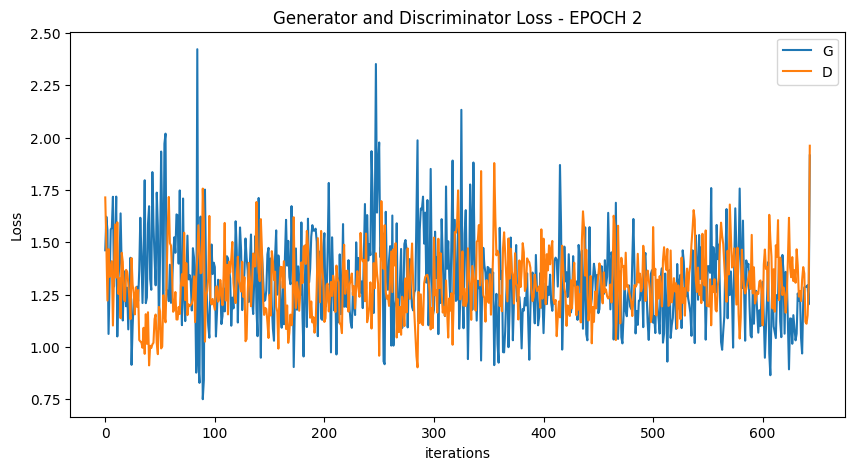

  0%|          | 0/644 [00:00<?, ?it/s]

[4/100][322/644] Loss_D: 1.5854 Loss_G: 0.9638 D(x): 0.3568 D(G(z)): 0.4230 / 0.3778
[4/100][644/644] Loss_D: 1.0591 Loss_G: 1.8554 D(x): 0.5328 D(G(z)): 0.3199 / 0.1325


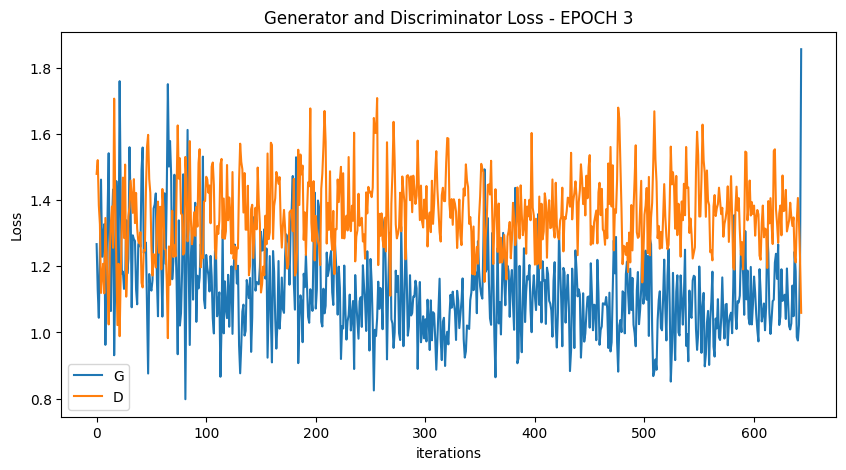

  0%|          | 0/644 [00:00<?, ?it/s]

[5/100][322/644] Loss_D: 1.4155 Loss_G: 1.1988 D(x): 0.4274 D(G(z)): 0.3979 / 0.2839
[6/100][644/644] Loss_D: 1.4989 Loss_G: 1.3605 D(x): 0.4122 D(G(z)): 0.4491 / 0.2274


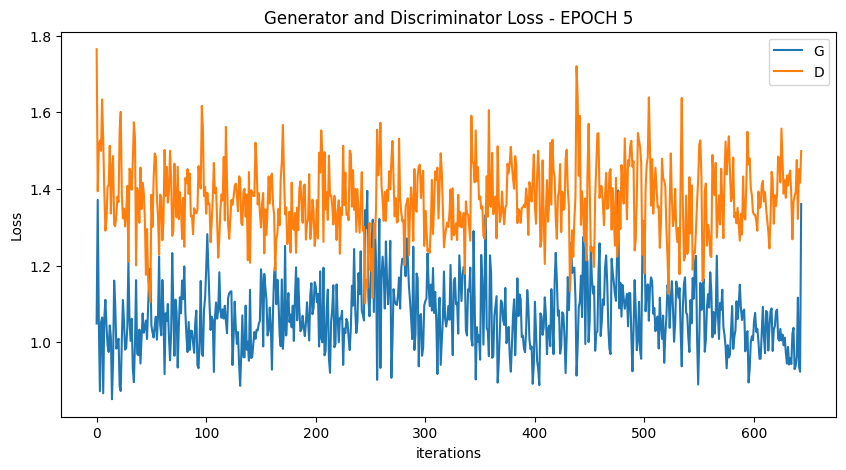

  0%|          | 0/644 [00:00<?, ?it/s]

[7/100][322/644] Loss_D: 1.4253 Loss_G: 0.9601 D(x): 0.3917 D(G(z)): 0.3902 / 0.3722
[7/100][644/644] Loss_D: 1.0701 Loss_G: 1.5204 D(x): 0.4800 D(G(z)): 0.2841 / 0.1899


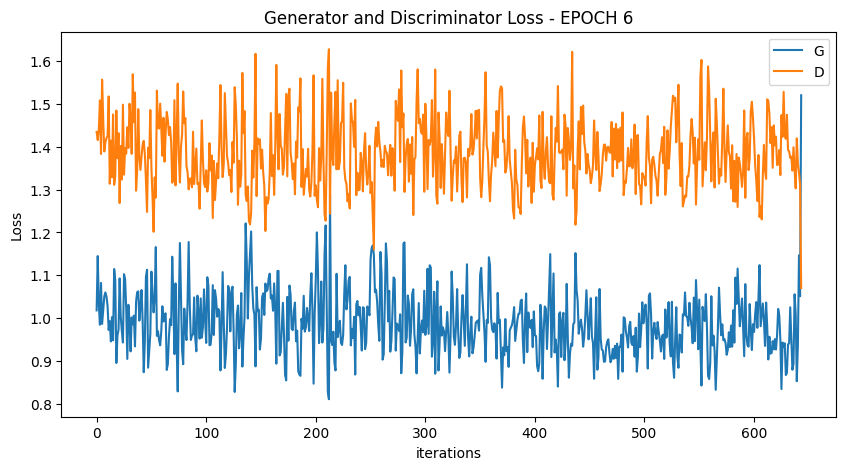

  0%|          | 0/644 [00:00<?, ?it/s]

[8/100][322/644] Loss_D: 1.2677 Loss_G: 1.0861 D(x): 0.4821 D(G(z)): 0.3858 / 0.3224


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[12/100][322/644] Loss_D: 1.4055 Loss_G: 0.9703 D(x): 0.4128 D(G(z)): 0.4086 / 0.3672
[12/100][644/644] Loss_D: 1.2505 Loss_G: 1.7434 D(x): 0.5395 D(G(z)): 0.4398 / 0.1522


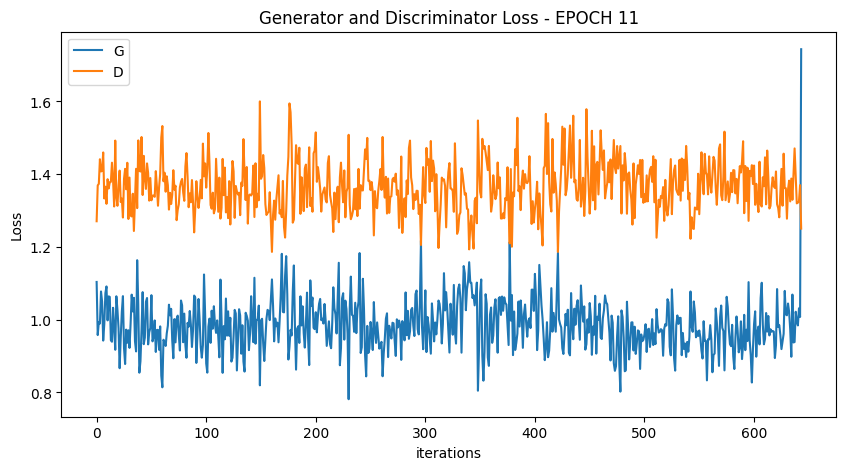

  0%|          | 0/644 [00:00<?, ?it/s]

[13/100][322/644] Loss_D: 1.3122 Loss_G: 1.0043 D(x): 0.4662 D(G(z)): 0.4108 / 0.3522
[13/100][644/644] Loss_D: 1.4158 Loss_G: 1.7180 D(x): 0.4936 D(G(z)): 0.5031 / 0.1551


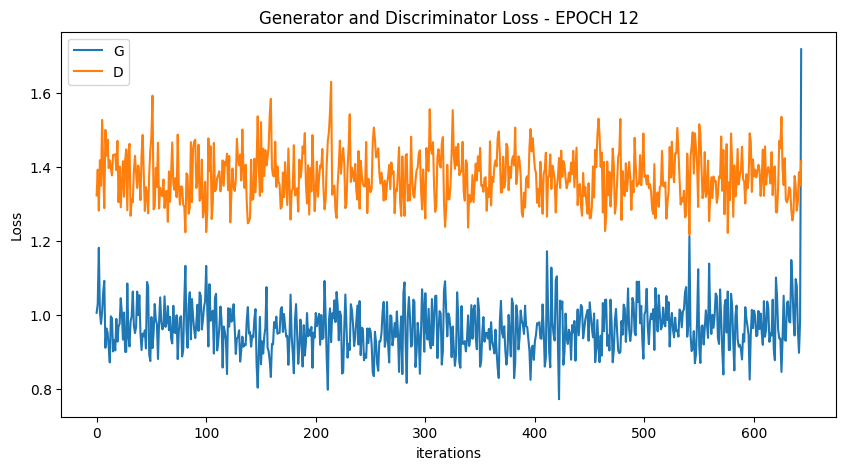

  0%|          | 0/644 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[17/100][644/644] Loss_D: 1.1846 Loss_G: 1.8073 D(x): 0.4955 D(G(z)): 0.3706 / 0.1443


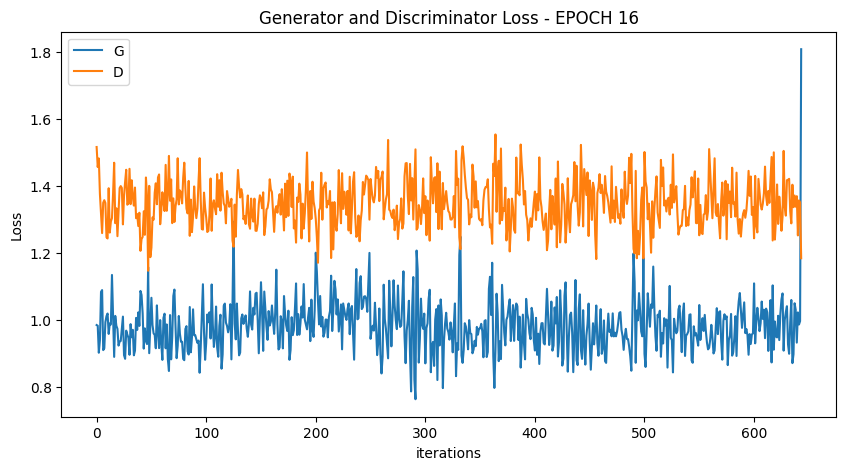

  0%|          | 0/644 [00:00<?, ?it/s]

[18/100][322/644] Loss_D: 1.3526 Loss_G: 1.0130 D(x): 0.4291 D(G(z)): 0.3852 / 0.3480
[18/100][644/644] Loss_D: 1.2574 Loss_G: 1.9076 D(x): 0.5348 D(G(z)): 0.4389 / 0.1228


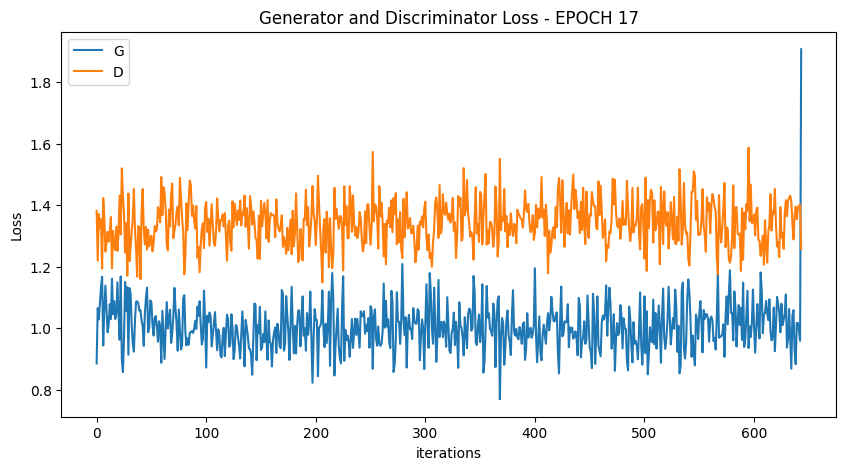

  0%|          | 0/644 [00:00<?, ?it/s]

[19/100][322/644] Loss_D: 1.3915 Loss_G: 0.9564 D(x): 0.4260 D(G(z)): 0.4112 / 0.3721


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[23/100][644/644] Loss_D: 1.2577 Loss_G: 1.4170 D(x): 0.3669 D(G(z)): 0.2438 / 0.2212


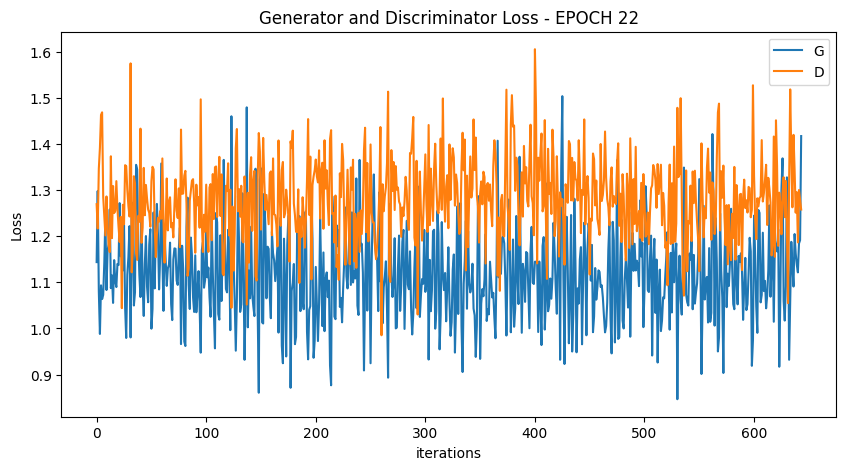

  0%|          | 0/644 [00:00<?, ?it/s]

[24/100][322/644] Loss_D: 1.3444 Loss_G: 1.1309 D(x): 0.5807 D(G(z)): 0.4973 / 0.3233
[24/100][644/644] Loss_D: 1.3554 Loss_G: 1.1309 D(x): 0.3426 D(G(z)): 0.2323 / 0.2976


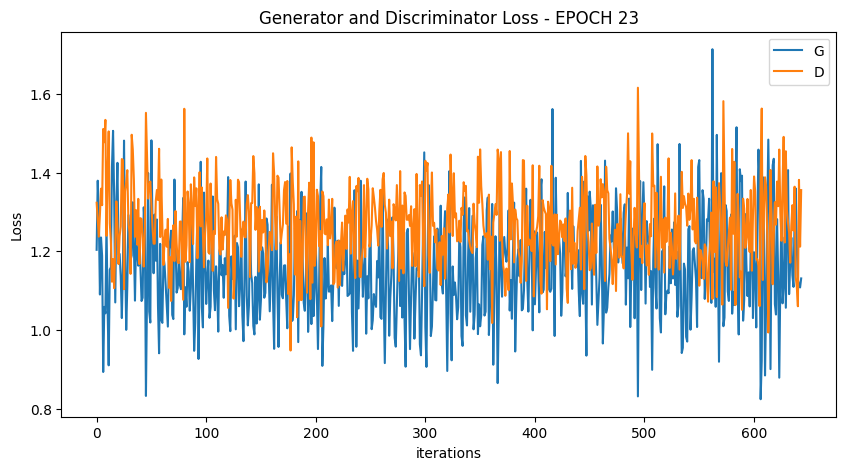

  0%|          | 0/644 [00:00<?, ?it/s]

[25/100][322/644] Loss_D: 1.4203 Loss_G: 0.9157 D(x): 0.3278 D(G(z)): 0.2698 / 0.3989


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[29/100][322/644] Loss_D: 1.3050 Loss_G: 0.9503 D(x): 0.4911 D(G(z)): 0.3671 / 0.3858
[29/100][644/644] Loss_D: 1.2863 Loss_G: 2.1251 D(x): 0.4305 D(G(z)): 0.3683 / 0.0974


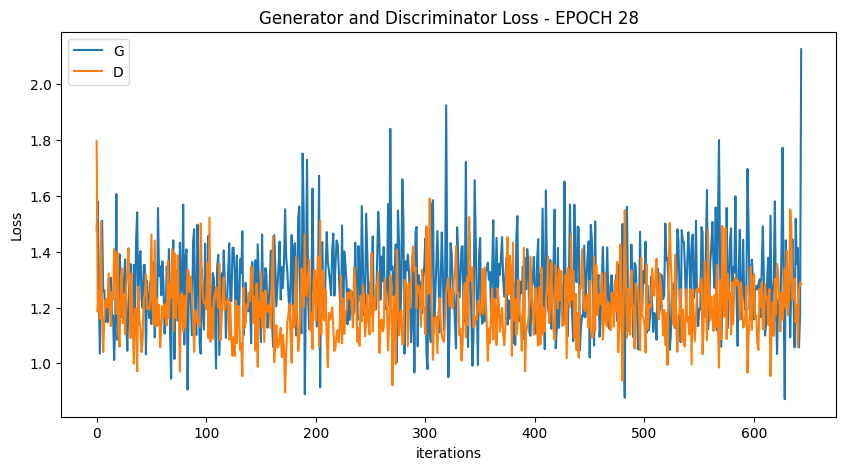

  0%|          | 0/644 [00:00<?, ?it/s]

[30/100][322/644] Loss_D: 1.1743 Loss_G: 1.1988 D(x): 0.5973 D(G(z)): 0.4203 / 0.2982
[30/100][644/644] Loss_D: 1.6071 Loss_G: 0.8201 D(x): 0.2650 D(G(z)): 0.2215 / 0.4449


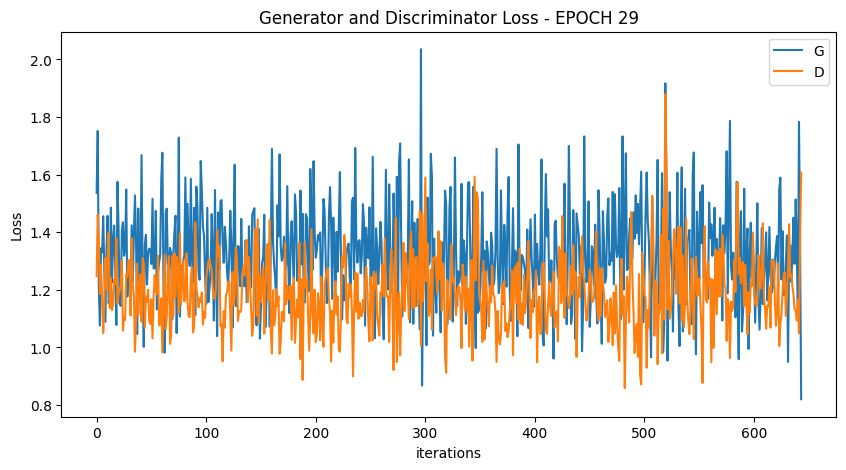

  0%|          | 0/644 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[35/100][322/644] Loss_D: 1.1604 Loss_G: 1.3754 D(x): 0.5401 D(G(z)): 0.3560 / 0.2463
[35/100][644/644] Loss_D: 1.0775 Loss_G: 2.0095 D(x): 0.4339 D(G(z)): 0.2194 / 0.1092


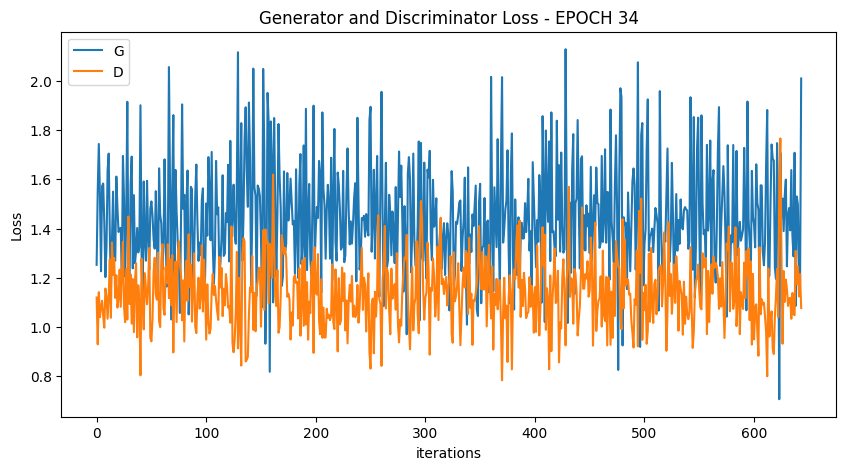

  0%|          | 0/644 [00:00<?, ?it/s]

[36/100][322/644] Loss_D: 1.0698 Loss_G: 1.5575 D(x): 0.6113 D(G(z)): 0.3576 / 0.2065
[36/100][644/644] Loss_D: 0.9023 Loss_G: 2.9761 D(x): 0.5447 D(G(z)): 0.1979 / 0.0412


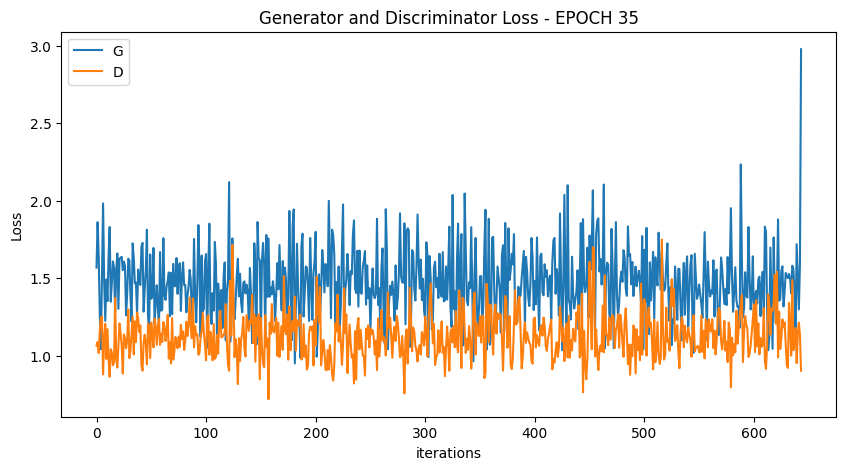

  0%|          | 0/644 [00:00<?, ?it/s]

[37/100][322/644] Loss_D: 1.0833 Loss_G: 1.3771 D(x): 0.6063 D(G(z)): 0.3606 / 0.2563
[37/100][644/644] Loss_D: 0.7731 Loss_G: 2.1962 D(x): 0.5580 D(G(z)): 0.1158 / 0.0899


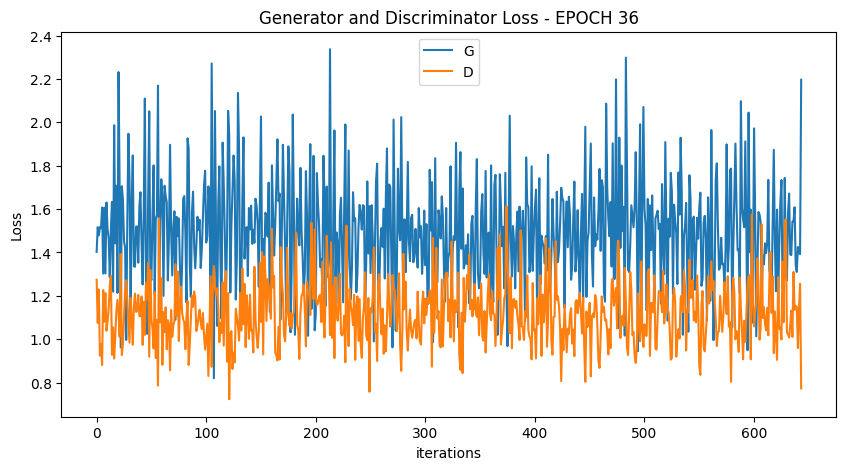

  0%|          | 0/644 [00:00<?, ?it/s]

[38/100][322/644] Loss_D: 1.1208 Loss_G: 1.2823 D(x): 0.4218 D(G(z)): 0.1767 / 0.2708
[38/100][644/644] Loss_D: 1.5424 Loss_G: 2.6512 D(x): 0.3442 D(G(z)): 0.3363 / 0.0680


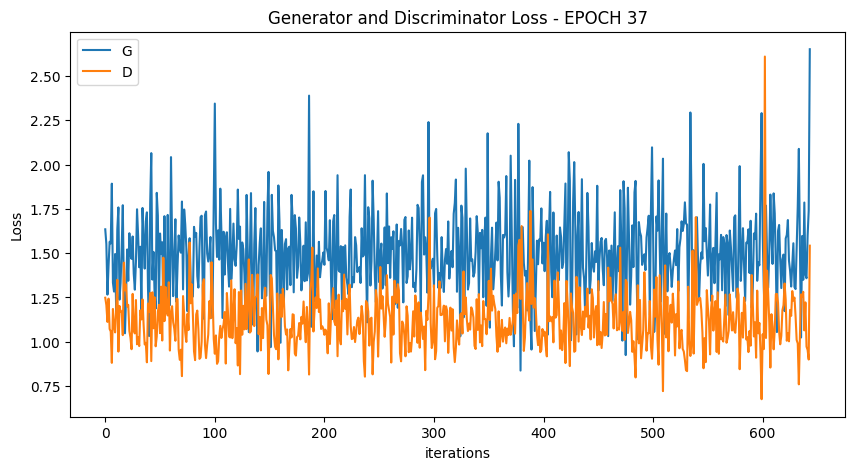

  0%|          | 0/644 [00:00<?, ?it/s]

[39/100][322/644] Loss_D: 1.0048 Loss_G: 1.5233 D(x): 0.6259 D(G(z)): 0.3338 / 0.2188
[39/100][644/644] Loss_D: 2.1385 Loss_G: 1.8930 D(x): 0.1453 D(G(z)): 0.2186 / 0.1572


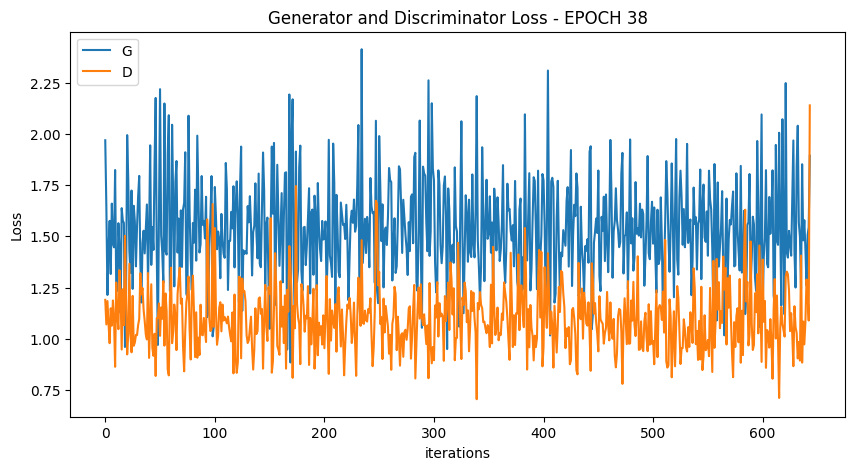

  0%|          | 0/644 [00:00<?, ?it/s]

[40/100][322/644] Loss_D: 1.3168 Loss_G: 1.2396 D(x): 0.5323 D(G(z)): 0.3828 / 0.2840
[40/100][644/644] Loss_D: 0.9341 Loss_G: 2.0327 D(x): 0.4870 D(G(z)): 0.1828 / 0.1259


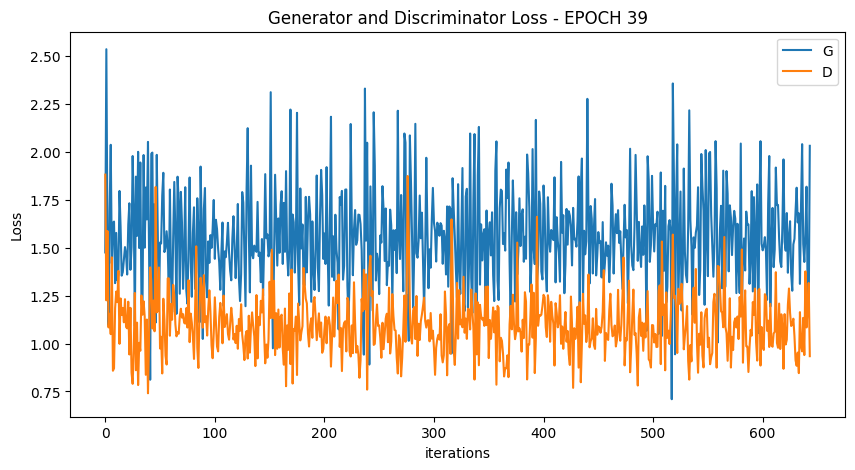

  0%|          | 0/644 [00:00<?, ?it/s]

[41/100][322/644] Loss_D: 1.2111 Loss_G: 1.6129 D(x): 0.6481 D(G(z)): 0.4415 / 0.1964
[41/100][644/644] Loss_D: 1.2882 Loss_G: 2.1381 D(x): 0.3920 D(G(z)): 0.2769 / 0.1152


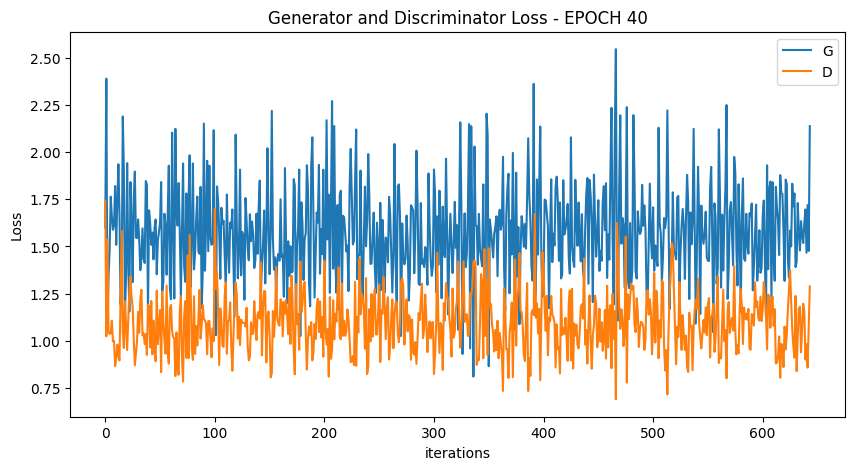

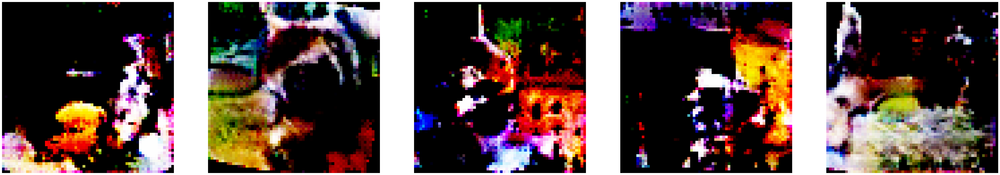

  0%|          | 0/644 [00:00<?, ?it/s]

[42/100][322/644] Loss_D: 0.8885 Loss_G: 1.5621 D(x): 0.7246 D(G(z)): 0.3266 / 0.2018
[42/100][644/644] Loss_D: 0.6161 Loss_G: 2.5436 D(x): 0.6291 D(G(z)): 0.0872 / 0.0603


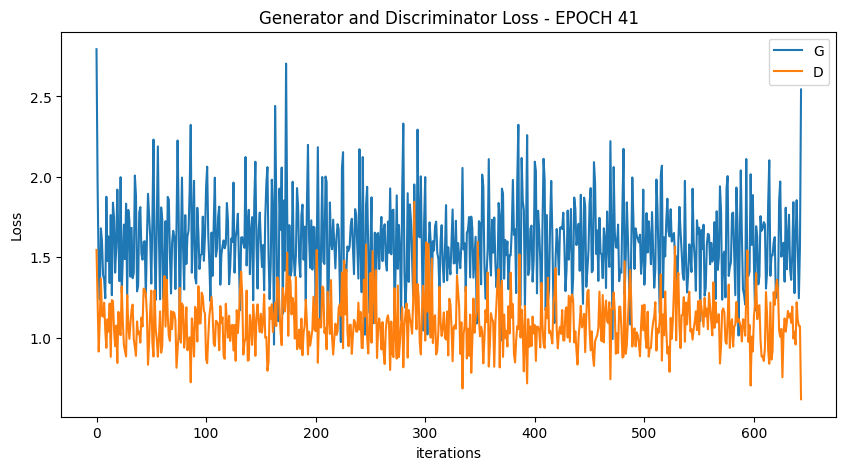

  0%|          | 0/644 [00:00<?, ?it/s]

[43/100][322/644] Loss_D: 1.0906 Loss_G: 1.7538 D(x): 0.6506 D(G(z)): 0.3796 / 0.1676
[43/100][644/644] Loss_D: 1.3760 Loss_G: 1.6838 D(x): 0.2940 D(G(z)): 0.1761 / 0.1747


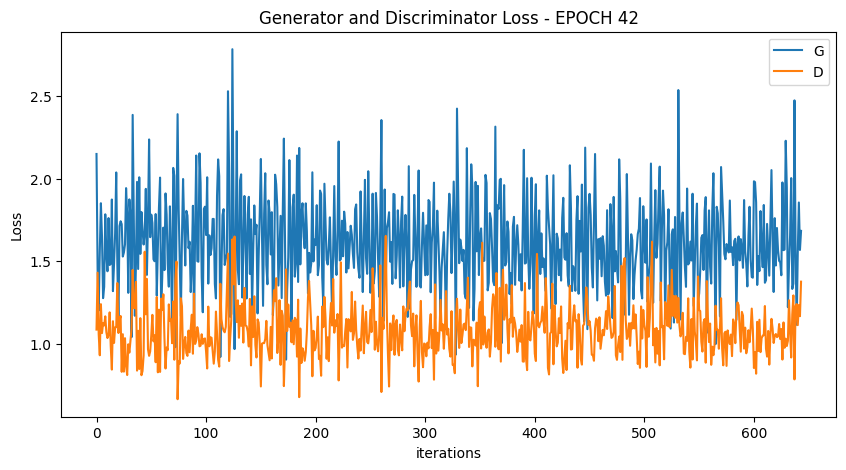

  0%|          | 0/644 [00:00<?, ?it/s]

[44/100][322/644] Loss_D: 1.1545 Loss_G: 1.3018 D(x): 0.5282 D(G(z)): 0.3395 / 0.2921
[44/100][644/644] Loss_D: 0.9216 Loss_G: 2.6914 D(x): 0.5678 D(G(z)): 0.2401 / 0.0539


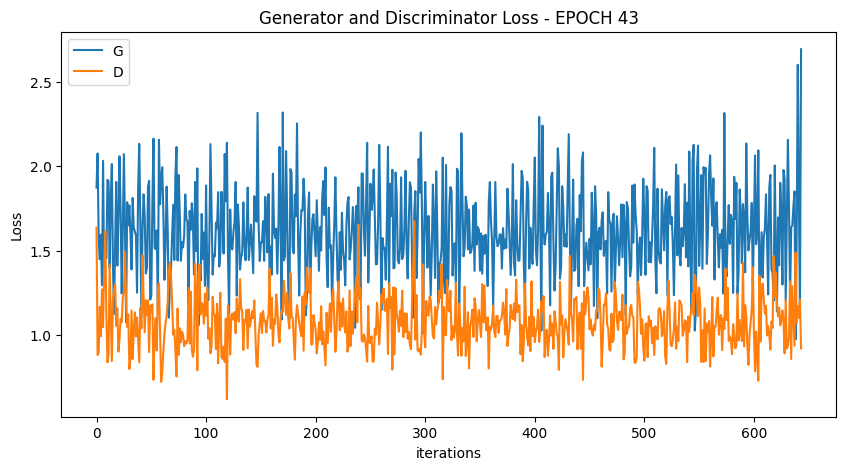

  0%|          | 0/644 [00:00<?, ?it/s]

[45/100][322/644] Loss_D: 1.2042 Loss_G: 1.4531 D(x): 0.4687 D(G(z)): 0.2747 / 0.2303
[45/100][644/644] Loss_D: 0.6010 Loss_G: 3.0136 D(x): 0.6635 D(G(z)): 0.1023 / 0.0358


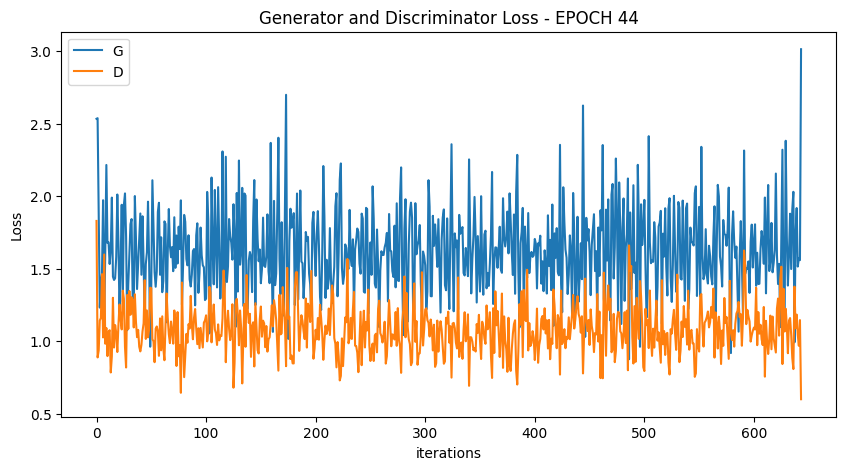

  0%|          | 0/644 [00:00<?, ?it/s]

[46/100][322/644] Loss_D: 1.0953 Loss_G: 1.1221 D(x): 0.5007 D(G(z)): 0.2780 / 0.3280
[46/100][644/644] Loss_D: 1.0271 Loss_G: 4.0709 D(x): 0.6416 D(G(z)): 0.3161 / 0.0175


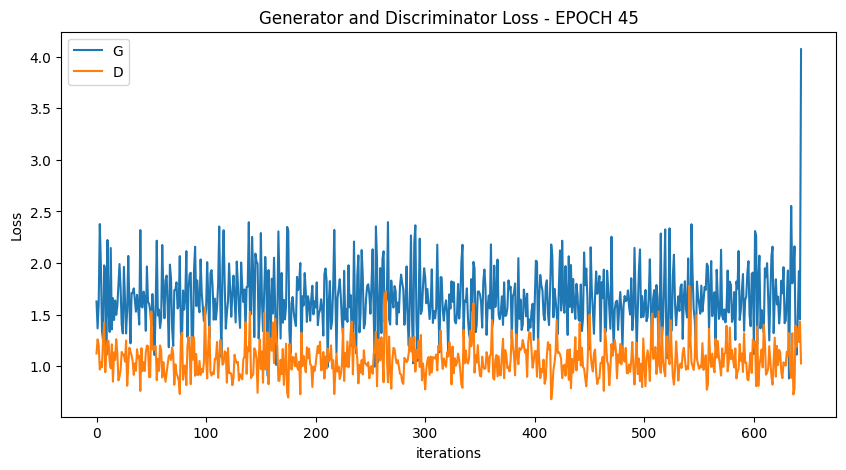

  0%|          | 0/644 [00:00<?, ?it/s]

[47/100][322/644] Loss_D: 1.0010 Loss_G: 1.3496 D(x): 0.5172 D(G(z)): 0.2322 / 0.2514
[47/100][644/644] Loss_D: 1.0123 Loss_G: 5.2091 D(x): 0.7945 D(G(z)): 0.4335 / 0.0076


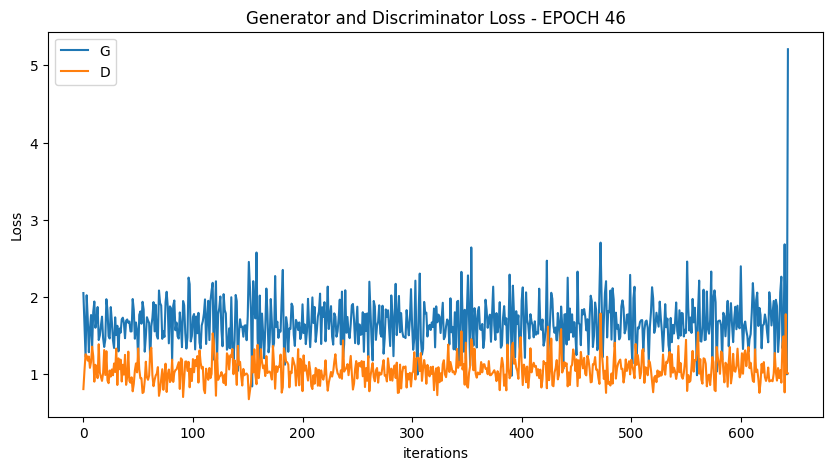

  0%|          | 0/644 [00:00<?, ?it/s]

[48/100][322/644] Loss_D: 0.8475 Loss_G: 1.6337 D(x): 0.6643 D(G(z)): 0.2567 / 0.1901
[48/100][644/644] Loss_D: 1.6189 Loss_G: 2.1136 D(x): 0.2593 D(G(z)): 0.1466 / 0.1062


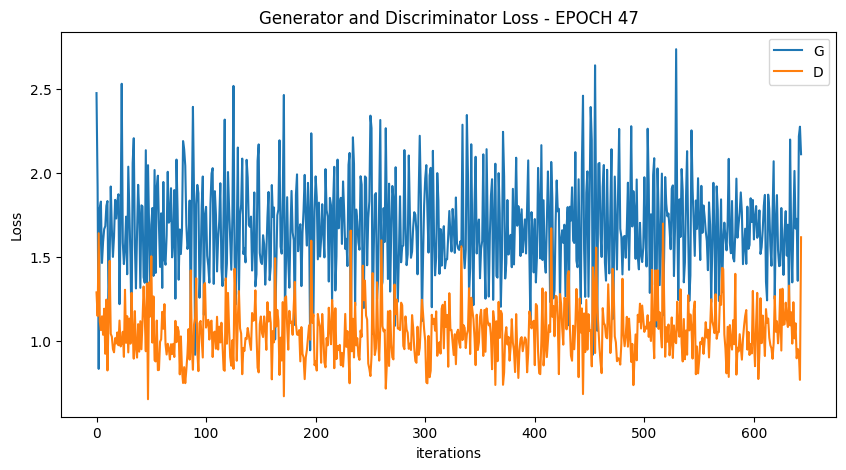

  0%|          | 0/644 [00:00<?, ?it/s]

[49/100][322/644] Loss_D: 1.0066 Loss_G: 1.7212 D(x): 0.6057 D(G(z)): 0.2986 / 0.1714
[49/100][644/644] Loss_D: 0.6824 Loss_G: 4.7389 D(x): 0.8384 D(G(z)): 0.2763 / 0.0056


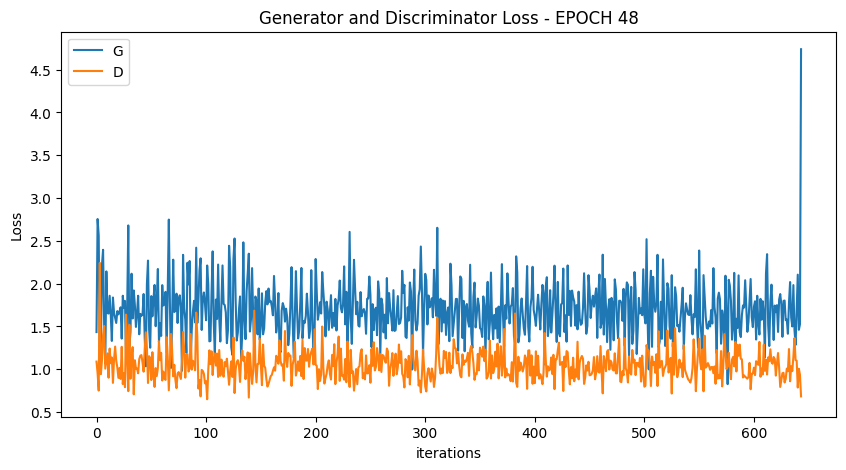

  0%|          | 0/644 [00:00<?, ?it/s]

[50/100][322/644] Loss_D: 1.0380 Loss_G: 1.3181 D(x): 0.5263 D(G(z)): 0.2364 / 0.2937
[50/100][644/644] Loss_D: 1.9215 Loss_G: 2.1995 D(x): 0.1906 D(G(z)): 0.2316 / 0.0948


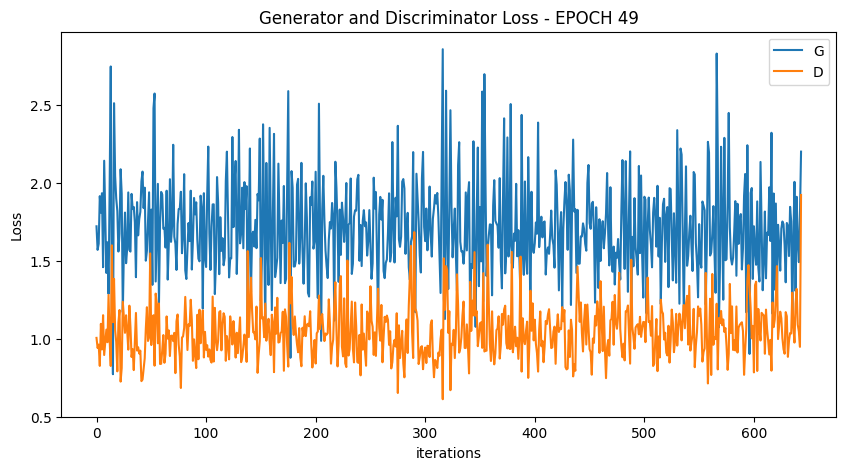

  0%|          | 0/644 [00:00<?, ?it/s]

[51/100][322/644] Loss_D: 1.0851 Loss_G: 1.8061 D(x): 0.7757 D(G(z)): 0.4563 / 0.1560
[51/100][644/644] Loss_D: 0.8693 Loss_G: 3.7539 D(x): 0.6294 D(G(z)): 0.2304 / 0.0178


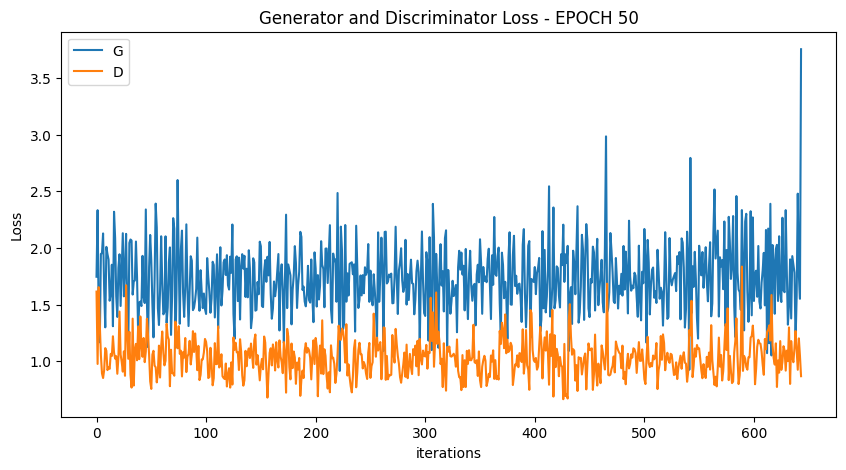

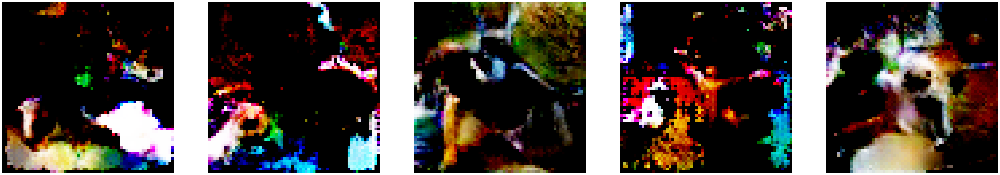

  0%|          | 0/644 [00:00<?, ?it/s]

[52/100][322/644] Loss_D: 0.9609 Loss_G: 1.6073 D(x): 0.5667 D(G(z)): 0.2271 / 0.2184
[52/100][644/644] Loss_D: 0.5575 Loss_G: 3.1553 D(x): 0.7592 D(G(z)): 0.0532 / 0.0333


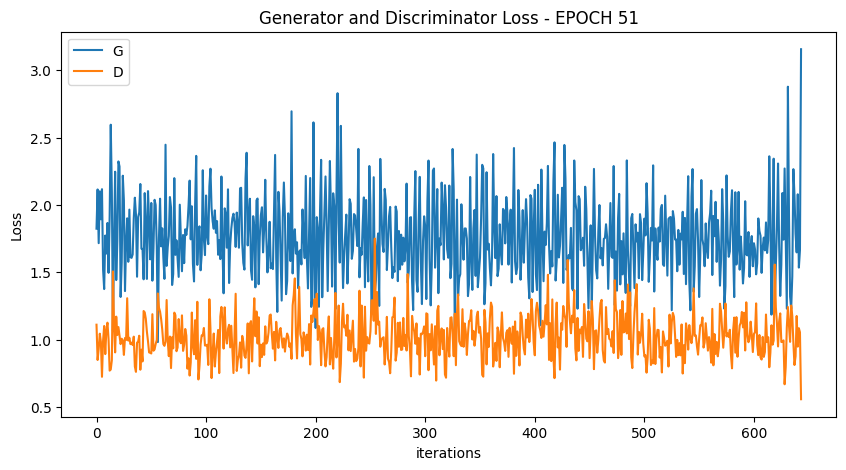

  0%|          | 0/644 [00:00<?, ?it/s]

[53/100][322/644] Loss_D: 0.8471 Loss_G: 1.8029 D(x): 0.7440 D(G(z)): 0.3121 / 0.1519
[53/100][644/644] Loss_D: 1.8412 Loss_G: 1.2389 D(x): 0.1668 D(G(z)): 0.1204 / 0.2788


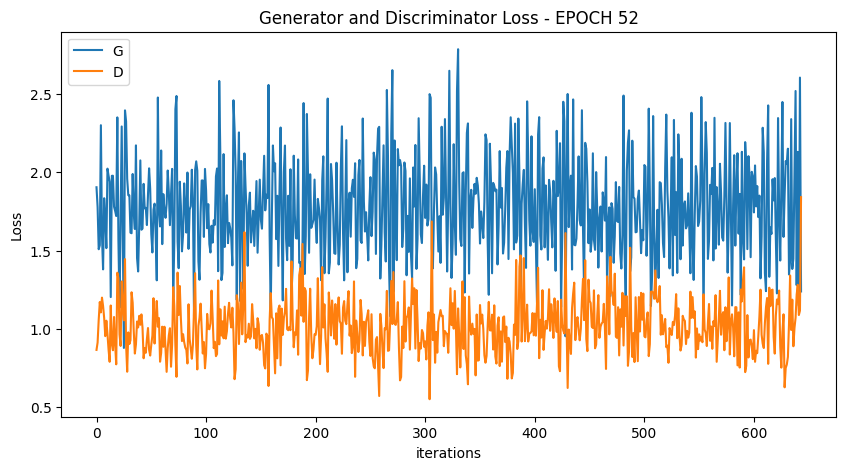

  0%|          | 0/644 [00:00<?, ?it/s]

[54/100][322/644] Loss_D: 0.8072 Loss_G: 2.1189 D(x): 0.7425 D(G(z)): 0.2547 / 0.1271
[54/100][644/644] Loss_D: 1.5900 Loss_G: 2.9836 D(x): 0.3201 D(G(z)): 0.1222 / 0.0533


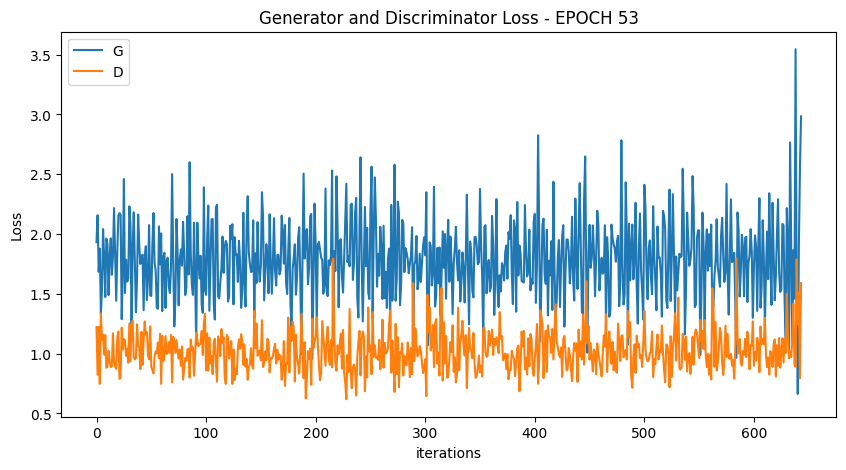

  0%|          | 0/644 [00:00<?, ?it/s]

[55/100][322/644] Loss_D: 0.8429 Loss_G: 1.9240 D(x): 0.6374 D(G(z)): 0.1990 / 0.1769
[55/100][644/644] Loss_D: 0.9121 Loss_G: 2.3719 D(x): 0.4584 D(G(z)): 0.1147 / 0.0731


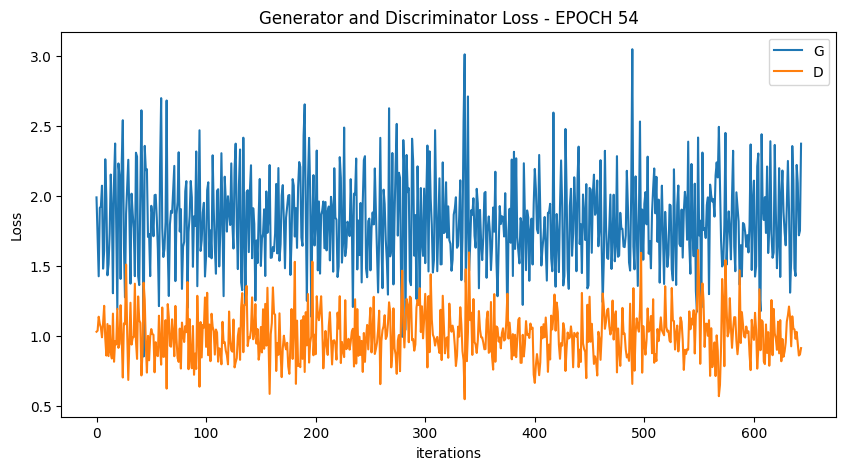

  0%|          | 0/644 [00:00<?, ?it/s]

[56/100][322/644] Loss_D: 0.7910 Loss_G: 2.2310 D(x): 0.7360 D(G(z)): 0.2674 / 0.1042
[56/100][644/644] Loss_D: 0.7255 Loss_G: 2.8842 D(x): 0.6100 D(G(z)): 0.1287 / 0.0418


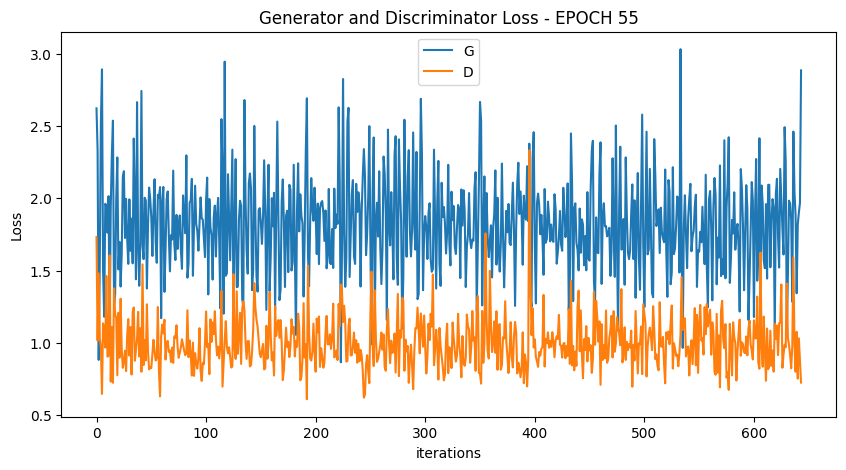

  0%|          | 0/644 [00:00<?, ?it/s]

[57/100][322/644] Loss_D: 0.7773 Loss_G: 2.4570 D(x): 0.7332 D(G(z)): 0.2411 / 0.0830
[57/100][644/644] Loss_D: 1.0461 Loss_G: 2.7489 D(x): 0.4556 D(G(z)): 0.1046 / 0.0577


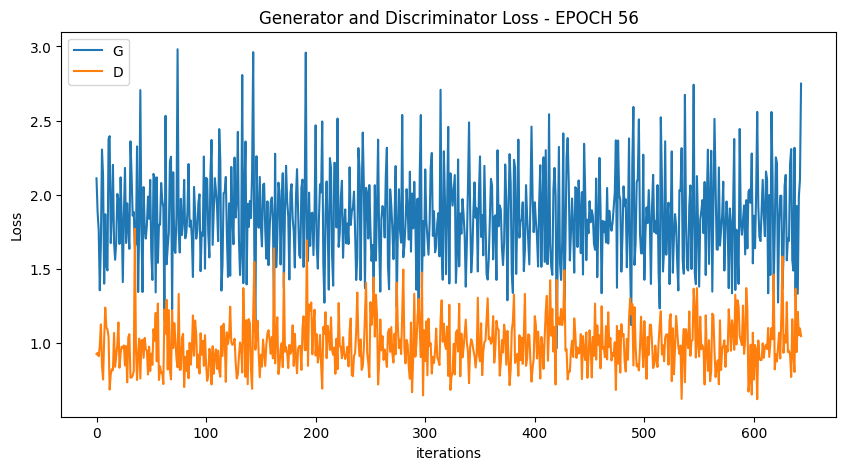

  0%|          | 0/644 [00:00<?, ?it/s]

[58/100][322/644] Loss_D: 0.9192 Loss_G: 2.0070 D(x): 0.7580 D(G(z)): 0.3297 / 0.1407
[58/100][644/644] Loss_D: 1.0683 Loss_G: 2.9277 D(x): 0.4495 D(G(z)): 0.1832 / 0.0584


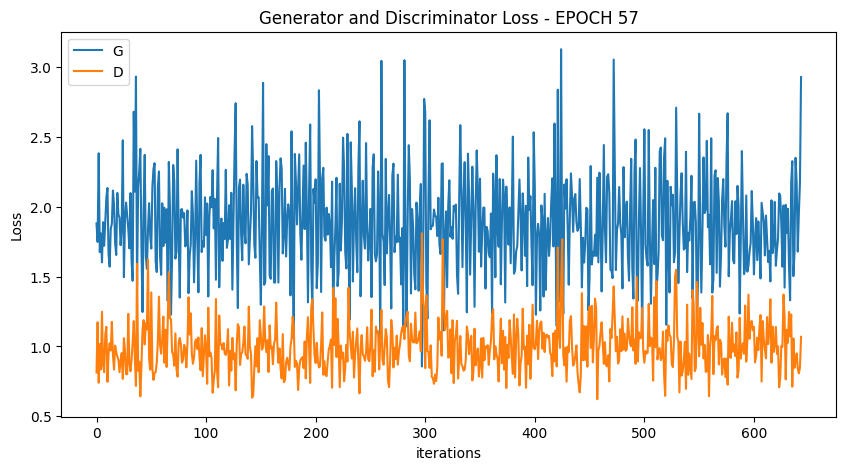

  0%|          | 0/644 [00:00<?, ?it/s]

[59/100][322/644] Loss_D: 0.7667 Loss_G: 2.2372 D(x): 0.8161 D(G(z)): 0.2758 / 0.0995
[59/100][644/644] Loss_D: 0.6783 Loss_G: 3.6627 D(x): 0.6621 D(G(z)): 0.1363 / 0.0175


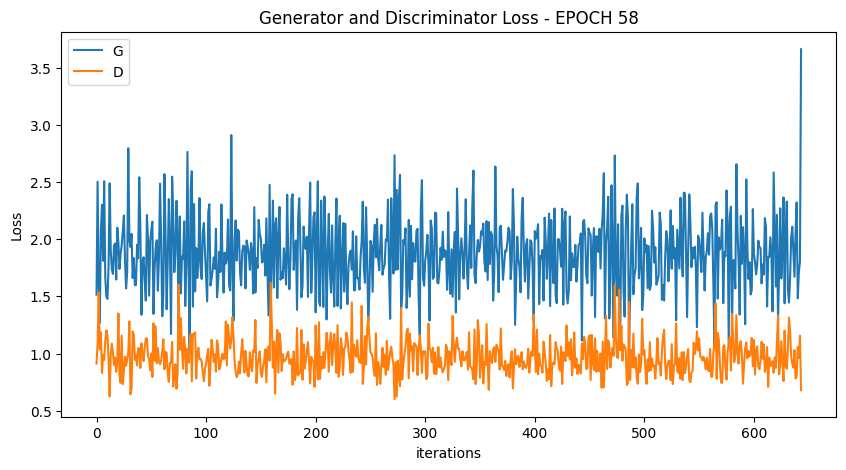

  0%|          | 0/644 [00:00<?, ?it/s]

[60/100][322/644] Loss_D: 0.8005 Loss_G: 2.4762 D(x): 0.8880 D(G(z)): 0.3101 / 0.0826
[60/100][644/644] Loss_D: 0.9835 Loss_G: 2.6036 D(x): 0.4744 D(G(z)): 0.0513 / 0.0707


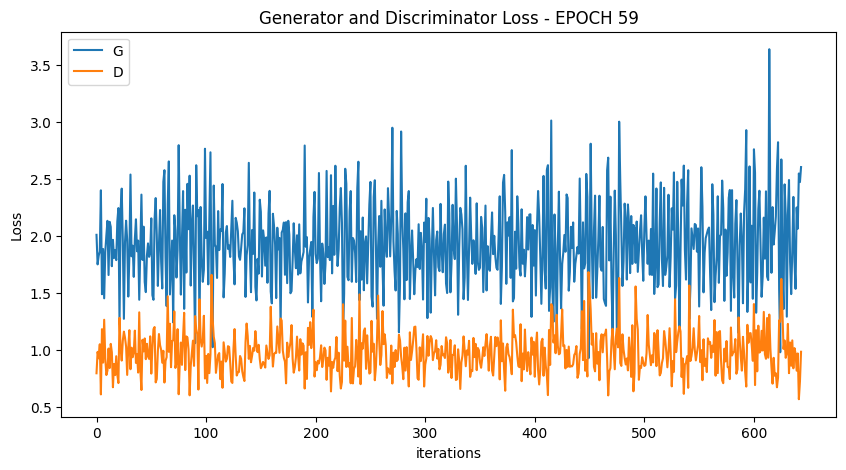

  0%|          | 0/644 [00:00<?, ?it/s]

[61/100][322/644] Loss_D: 1.1510 Loss_G: 2.2154 D(x): 0.7532 D(G(z)): 0.4500 / 0.1073
[61/100][644/644] Loss_D: 1.6190 Loss_G: 3.2637 D(x): 0.3552 D(G(z)): 0.2608 / 0.0452


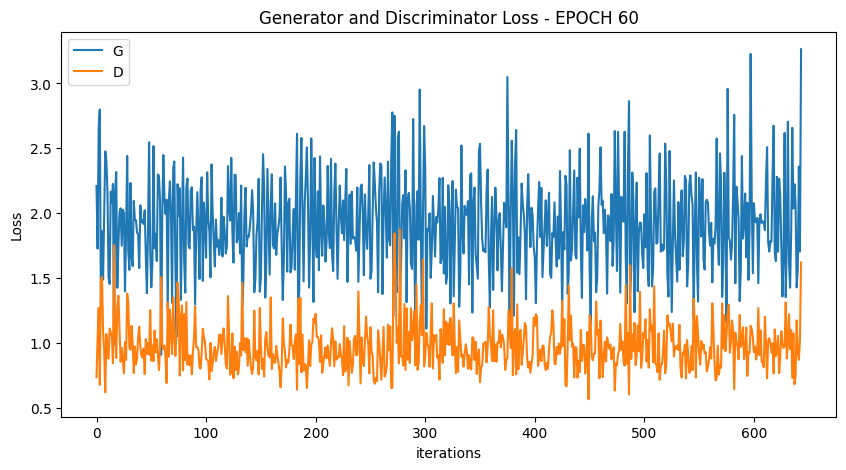

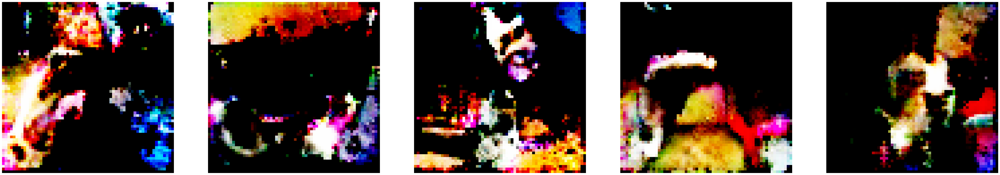

  0%|          | 0/644 [00:00<?, ?it/s]

[62/100][322/644] Loss_D: 1.0874 Loss_G: 1.5927 D(x): 0.4929 D(G(z)): 0.2233 / 0.2167
[62/100][644/644] Loss_D: 1.3953 Loss_G: 2.9003 D(x): 0.3252 D(G(z)): 0.2493 / 0.0741


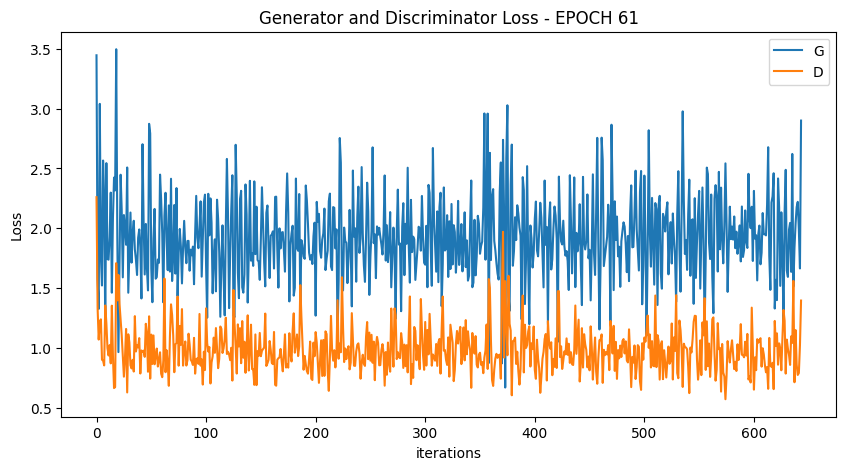

  0%|          | 0/644 [00:00<?, ?it/s]

[63/100][322/644] Loss_D: 1.4433 Loss_G: 1.8296 D(x): 0.3762 D(G(z)): 0.2673 / 0.1758
[63/100][644/644] Loss_D: 1.1640 Loss_G: 4.3759 D(x): 0.5441 D(G(z)): 0.3350 / 0.0296


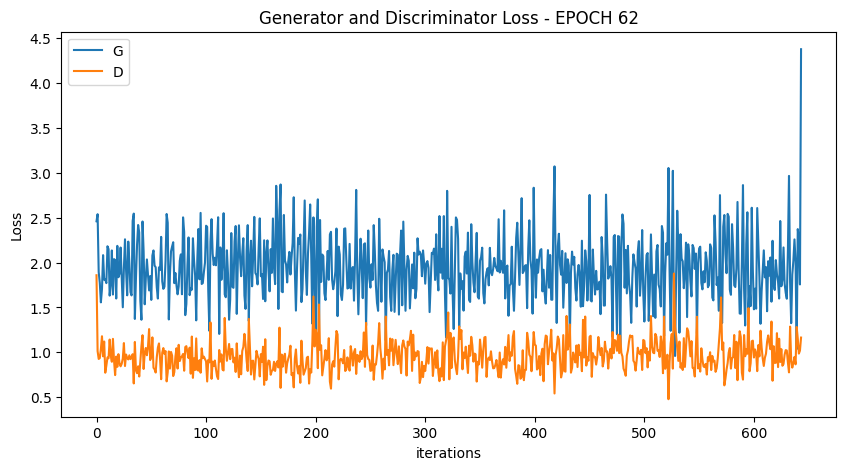

  0%|          | 0/644 [00:00<?, ?it/s]

[64/100][322/644] Loss_D: 0.9955 Loss_G: 2.0099 D(x): 0.6428 D(G(z)): 0.3190 / 0.1366
[64/100][644/644] Loss_D: 0.6231 Loss_G: 3.2411 D(x): 0.6739 D(G(z)): 0.0484 / 0.0293


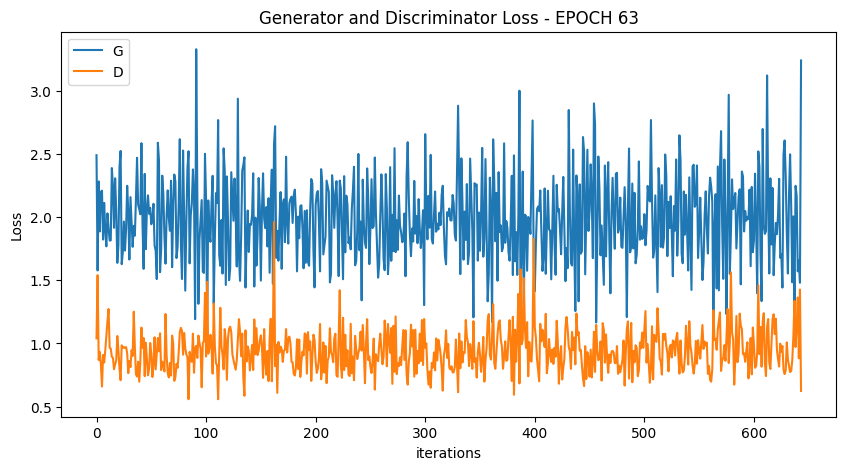

  0%|          | 0/644 [00:00<?, ?it/s]

[65/100][322/644] Loss_D: 1.0299 Loss_G: 1.7463 D(x): 0.5188 D(G(z)): 0.1877 / 0.1827
[65/100][644/644] Loss_D: 1.1827 Loss_G: 3.8270 D(x): 0.5266 D(G(z)): 0.2275 / 0.0225


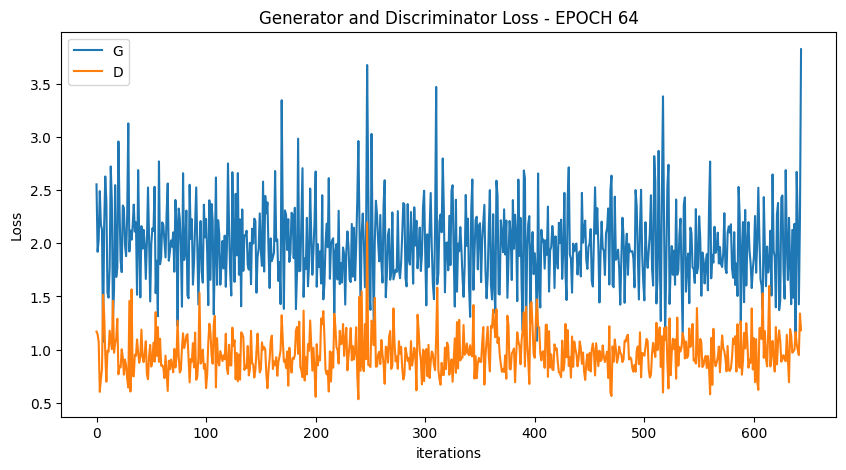

  0%|          | 0/644 [00:00<?, ?it/s]

[66/100][322/644] Loss_D: 1.0820 Loss_G: 2.3653 D(x): 0.7775 D(G(z)): 0.4104 / 0.0961
[66/100][644/644] Loss_D: 1.0361 Loss_G: 3.3602 D(x): 0.4826 D(G(z)): 0.1897 / 0.0260


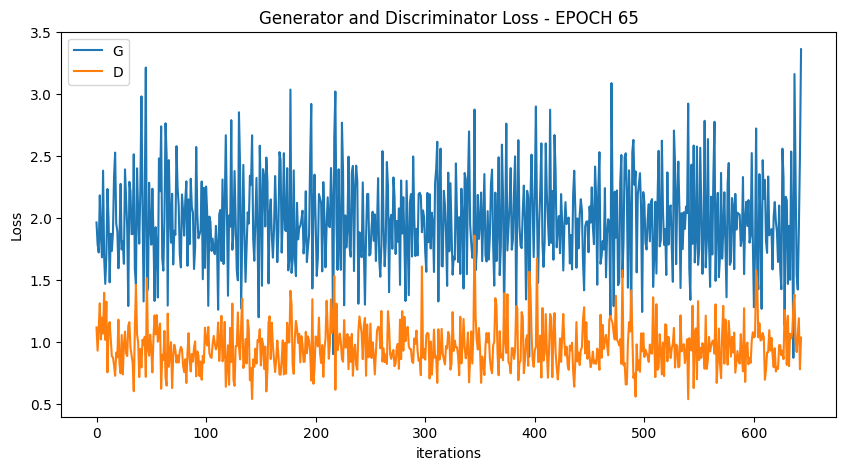

  0%|          | 0/644 [00:00<?, ?it/s]

[67/100][322/644] Loss_D: 0.8031 Loss_G: 2.3772 D(x): 0.6223 D(G(z)): 0.1464 / 0.0948
[67/100][644/644] Loss_D: 1.0853 Loss_G: 2.3653 D(x): 0.4842 D(G(z)): 0.0476 / 0.0839


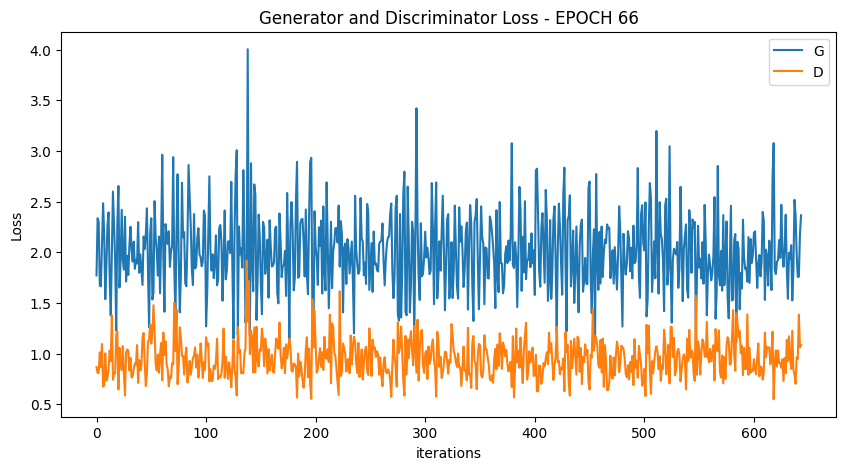

  0%|          | 0/644 [00:00<?, ?it/s]

[68/100][322/644] Loss_D: 1.0214 Loss_G: 2.7506 D(x): 0.7903 D(G(z)): 0.3697 / 0.0730
[68/100][644/644] Loss_D: 0.7209 Loss_G: 3.4918 D(x): 0.6782 D(G(z)): 0.1846 / 0.0241


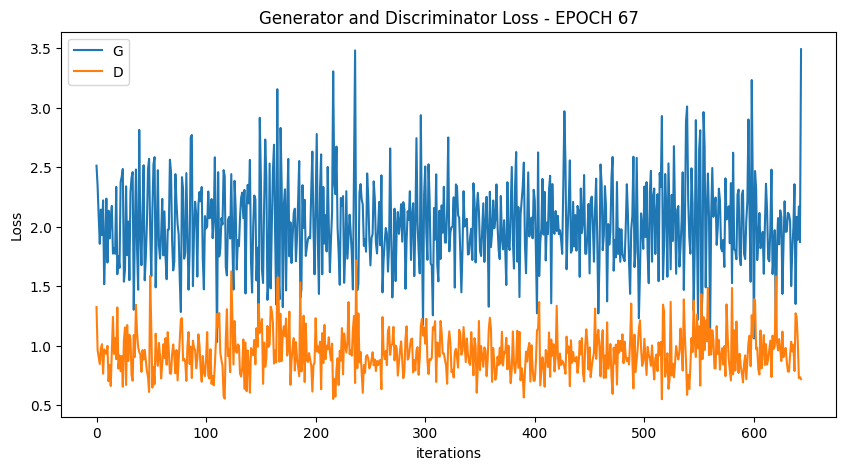

  0%|          | 0/644 [00:00<?, ?it/s]

[69/100][322/644] Loss_D: 1.2490 Loss_G: 1.7465 D(x): 0.5818 D(G(z)): 0.3933 / 0.1869
[69/100][644/644] Loss_D: 0.4981 Loss_G: 3.3595 D(x): 0.7538 D(G(z)): 0.0791 / 0.0339


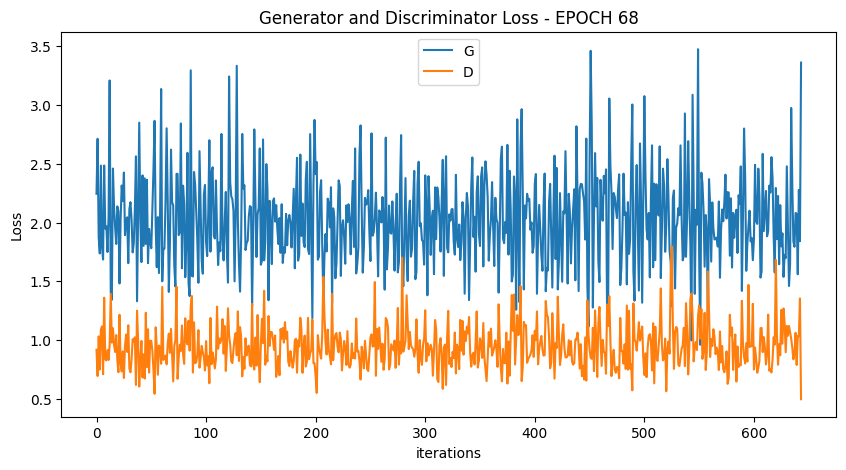

  0%|          | 0/644 [00:00<?, ?it/s]

[70/100][322/644] Loss_D: 0.8370 Loss_G: 1.7729 D(x): 0.6333 D(G(z)): 0.2162 / 0.1714
[70/100][644/644] Loss_D: 1.3852 Loss_G: 2.0452 D(x): 0.3418 D(G(z)): 0.0973 / 0.1078


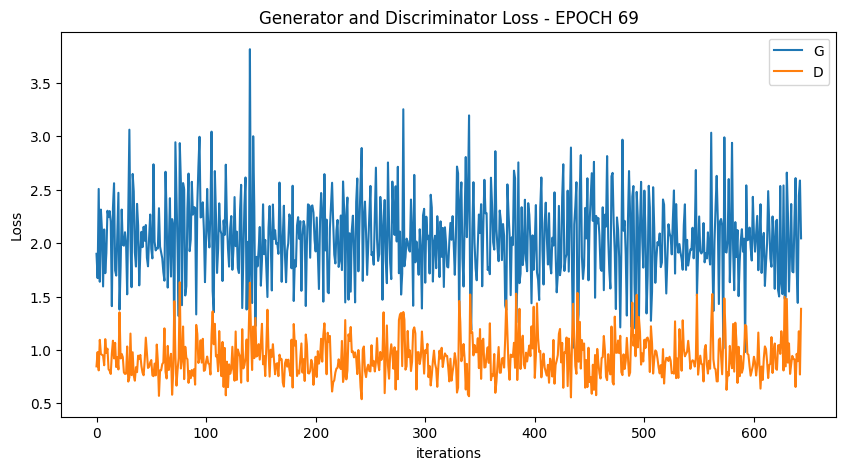

  0%|          | 0/644 [00:00<?, ?it/s]

[71/100][322/644] Loss_D: 0.7972 Loss_G: 2.2288 D(x): 0.7674 D(G(z)): 0.2668 / 0.1118
[71/100][644/644] Loss_D: 1.1812 Loss_G: 2.8782 D(x): 0.4829 D(G(z)): 0.1305 / 0.0477


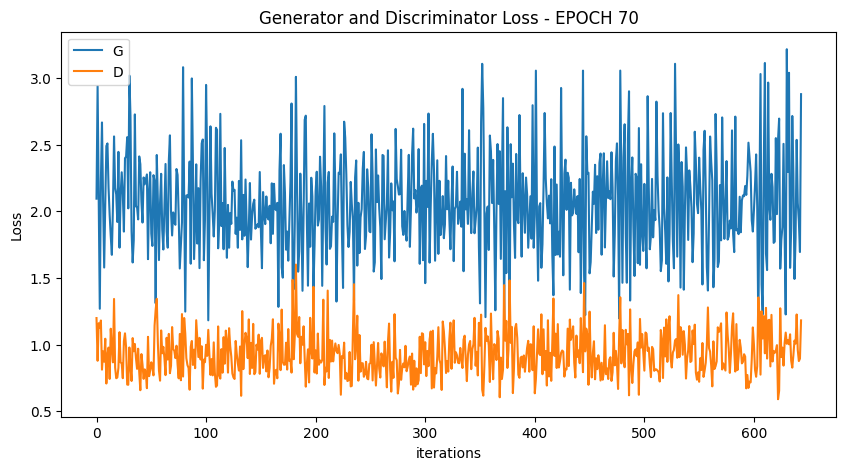

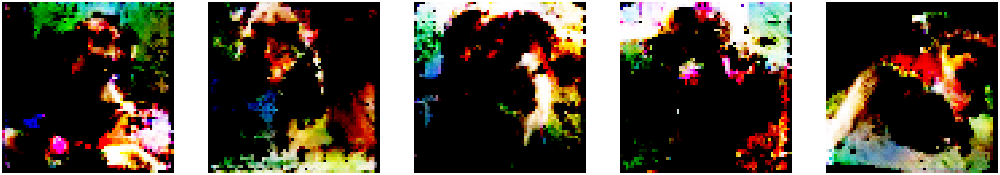

  0%|          | 0/644 [00:00<?, ?it/s]

[72/100][322/644] Loss_D: 0.9317 Loss_G: 1.9525 D(x): 0.6313 D(G(z)): 0.2603 / 0.1416
[73/100][322/644] Loss_D: 1.1567 Loss_G: 1.4560 D(x): 0.4712 D(G(z)): 0.2161 / 0.2433
[73/100][644/644] Loss_D: 0.9544 Loss_G: 2.3860 D(x): 0.4897 D(G(z)): 0.1157 / 0.0732


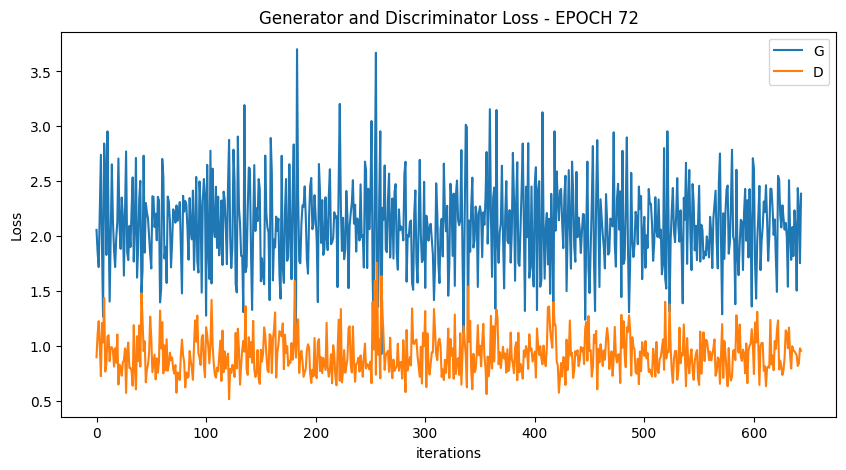

  0%|          | 0/644 [00:00<?, ?it/s]

[74/100][322/644] Loss_D: 0.8908 Loss_G: 2.6229 D(x): 0.7892 D(G(z)): 0.3472 / 0.0721
[74/100][644/644] Loss_D: 0.6907 Loss_G: 6.3730 D(x): 0.8706 D(G(z)): 0.2079 / 0.0067


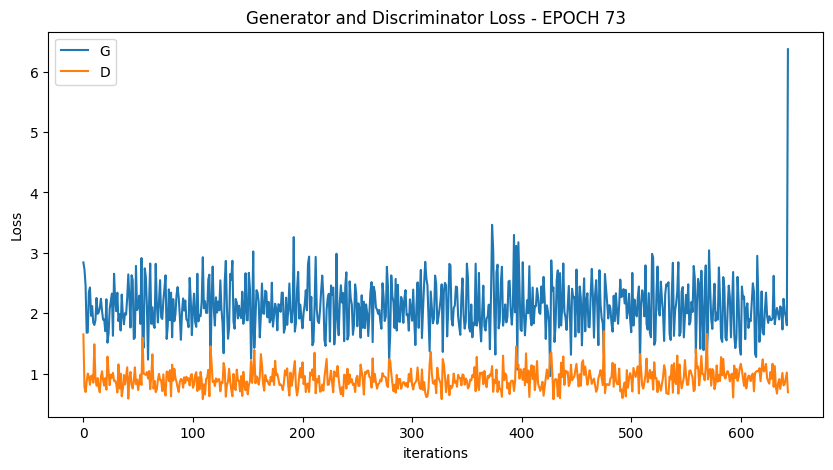

  0%|          | 0/644 [00:00<?, ?it/s]

[75/100][322/644] Loss_D: 0.8890 Loss_G: 1.7129 D(x): 0.5464 D(G(z)): 0.1061 / 0.1985
[75/100][644/644] Loss_D: 1.0598 Loss_G: 4.5733 D(x): 0.4872 D(G(z)): 0.1633 / 0.0169


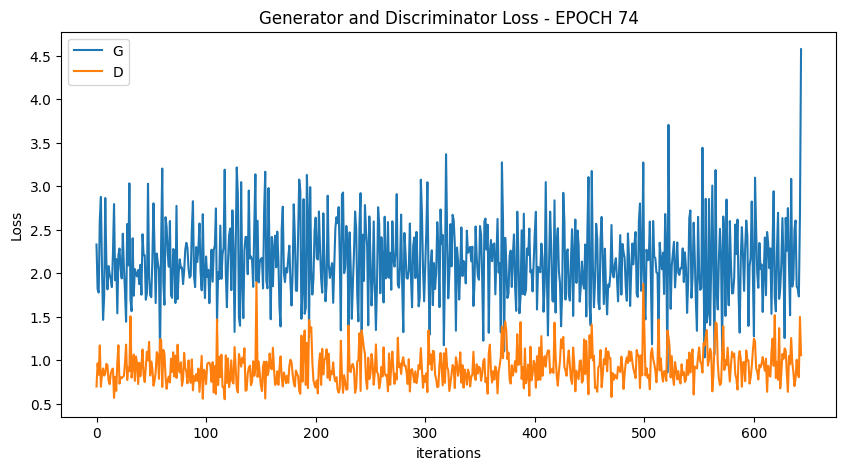

  0%|          | 0/644 [00:00<?, ?it/s]

[76/100][322/644] Loss_D: 0.7915 Loss_G: 2.1722 D(x): 0.5920 D(G(z)): 0.1165 / 0.1191
[76/100][644/644] Loss_D: 0.9687 Loss_G: 5.4801 D(x): 0.6903 D(G(z)): 0.3667 / 0.0030


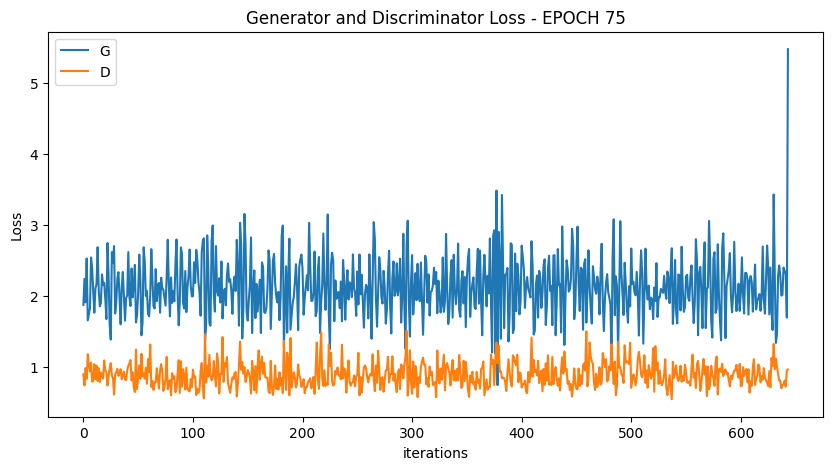

  0%|          | 0/644 [00:00<?, ?it/s]

[77/100][322/644] Loss_D: 0.7727 Loss_G: 2.1058 D(x): 0.6197 D(G(z)): 0.1602 / 0.1246
[77/100][644/644] Loss_D: 1.1538 Loss_G: 8.0168 D(x): 0.7064 D(G(z)): 0.4534 / 0.0007


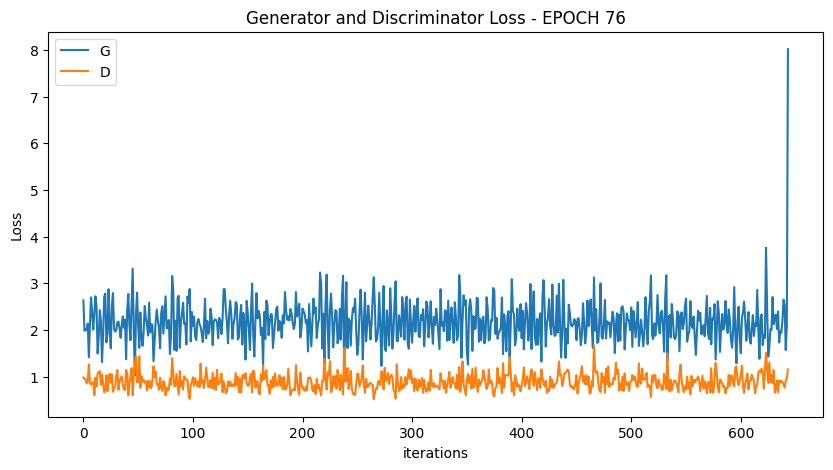

  0%|          | 0/644 [00:00<?, ?it/s]

[78/100][322/644] Loss_D: 0.7346 Loss_G: 2.8550 D(x): 0.8159 D(G(z)): 0.2540 / 0.0594
[78/100][644/644] Loss_D: 0.7860 Loss_G: 5.6479 D(x): 0.6850 D(G(z)): 0.2373 / 0.0086


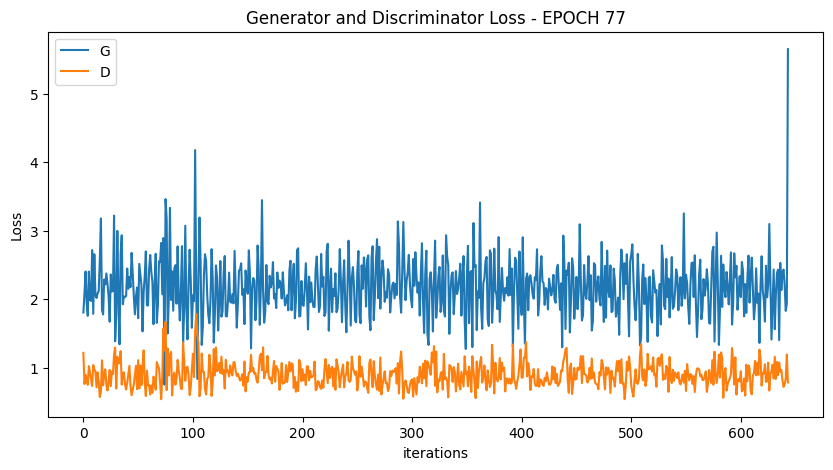

  0%|          | 0/644 [00:00<?, ?it/s]

[79/100][322/644] Loss_D: 0.8522 Loss_G: 2.1610 D(x): 0.7440 D(G(z)): 0.2938 / 0.1103
[79/100][644/644] Loss_D: 1.9389 Loss_G: 3.9520 D(x): 0.2115 D(G(z)): 0.2138 / 0.0142


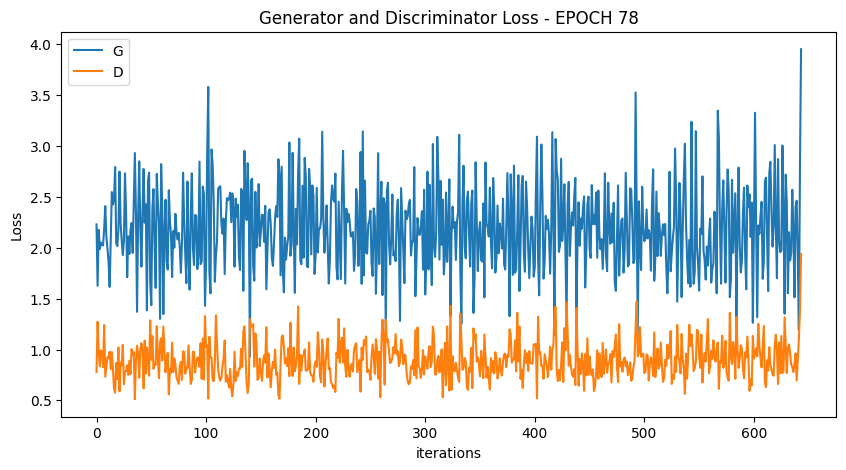

  0%|          | 0/644 [00:00<?, ?it/s]

[80/100][322/644] Loss_D: 0.9385 Loss_G: 2.0937 D(x): 0.6339 D(G(z)): 0.2349 / 0.1362
[80/100][644/644] Loss_D: 0.4196 Loss_G: 4.0766 D(x): 0.7936 D(G(z)): 0.0208 / 0.0146


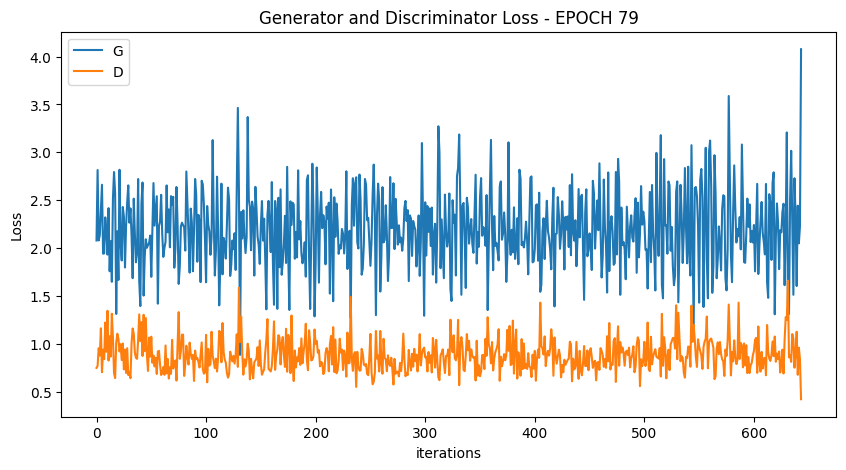

  0%|          | 0/644 [00:00<?, ?it/s]

[81/100][322/644] Loss_D: 0.6075 Loss_G: 2.3170 D(x): 0.7598 D(G(z)): 0.1571 / 0.1007
[81/100][644/644] Loss_D: 0.5131 Loss_G: 4.9660 D(x): 0.8862 D(G(z)): 0.1085 / 0.0057


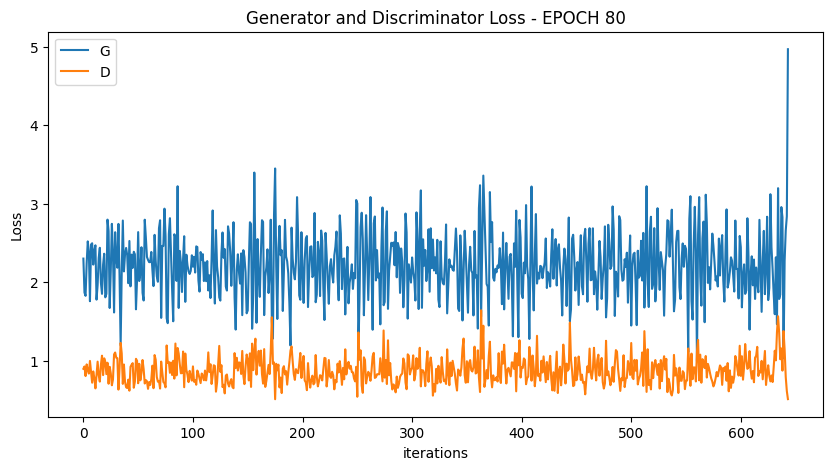

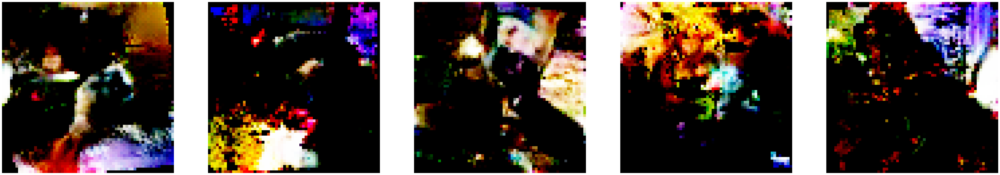

  0%|          | 0/644 [00:00<?, ?it/s]

[82/100][322/644] Loss_D: 0.9017 Loss_G: 1.9273 D(x): 0.6951 D(G(z)): 0.2606 / 0.1452
[82/100][644/644] Loss_D: 0.6770 Loss_G: 5.0122 D(x): 0.7769 D(G(z)): 0.1969 / 0.0054


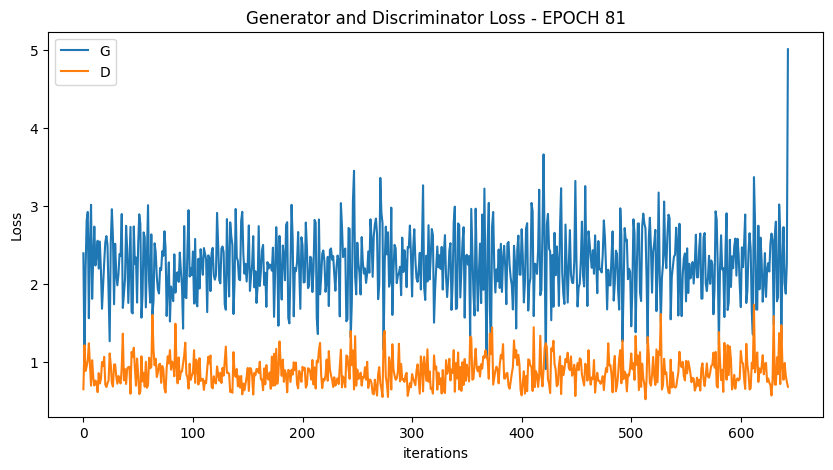

  0%|          | 0/644 [00:00<?, ?it/s]

[83/100][322/644] Loss_D: 1.0754 Loss_G: 1.9738 D(x): 0.5613 D(G(z)): 0.2863 / 0.1412
[83/100][644/644] Loss_D: 0.6976 Loss_G: 4.5967 D(x): 0.6862 D(G(z)): 0.1546 / 0.0171


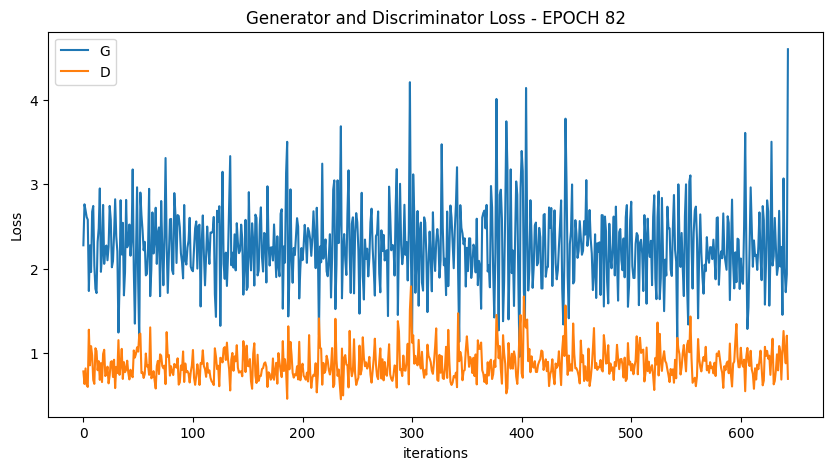

  0%|          | 0/644 [00:00<?, ?it/s]

[84/100][322/644] Loss_D: 0.9686 Loss_G: 1.4061 D(x): 0.4574 D(G(z)): 0.1237 / 0.2720
[84/100][644/644] Loss_D: 1.5533 Loss_G: 0.5850 D(x): 0.2507 D(G(z)): 0.0634 / 0.6288


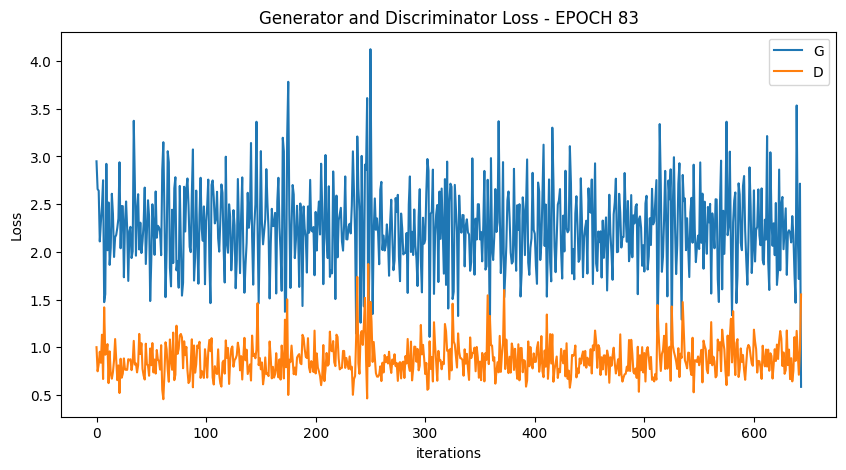

  0%|          | 0/644 [00:00<?, ?it/s]

[85/100][322/644] Loss_D: 0.9572 Loss_G: 2.3216 D(x): 0.7287 D(G(z)): 0.2934 / 0.1038
[85/100][644/644] Loss_D: 0.8303 Loss_G: 5.3880 D(x): 0.7350 D(G(z)): 0.2446 / 0.0059


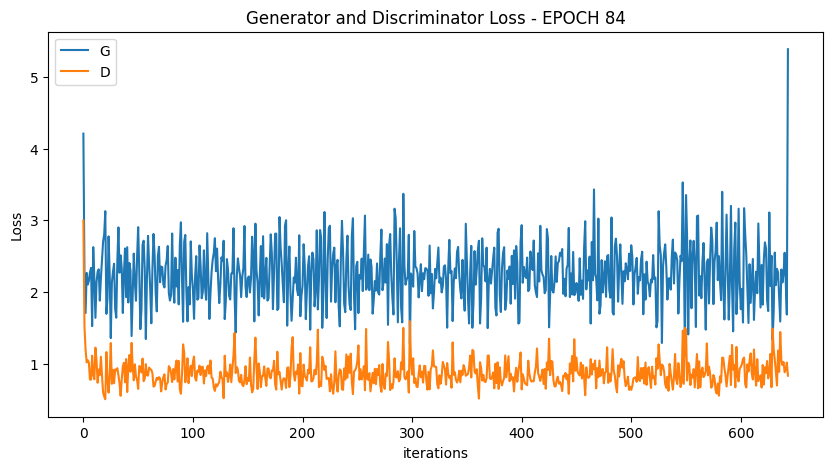

  0%|          | 0/644 [00:00<?, ?it/s]

[86/100][322/644] Loss_D: 0.9646 Loss_G: 1.6755 D(x): 0.5351 D(G(z)): 0.1650 / 0.2069
[86/100][644/644] Loss_D: 1.1334 Loss_G: 4.1670 D(x): 0.5134 D(G(z)): 0.1818 / 0.0160


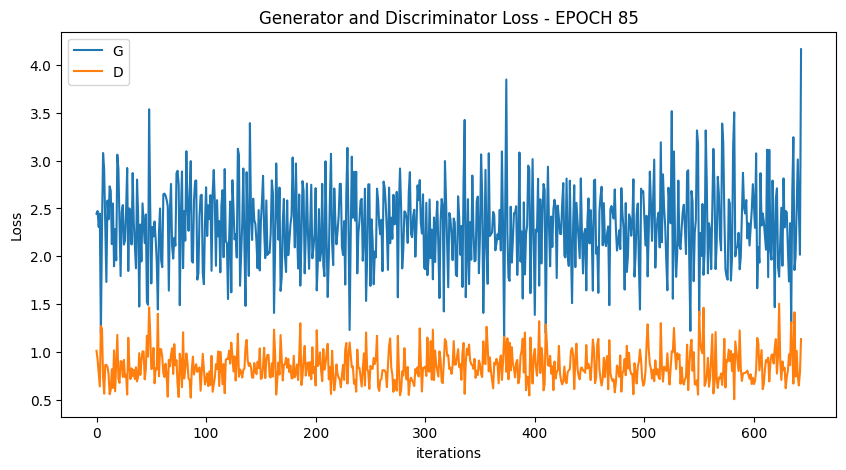

  0%|          | 0/644 [00:00<?, ?it/s]

[87/100][322/644] Loss_D: 0.6894 Loss_G: 2.6940 D(x): 0.8899 D(G(z)): 0.2362 / 0.0705
[87/100][644/644] Loss_D: 0.8981 Loss_G: 2.0862 D(x): 0.4524 D(G(z)): 0.0399 / 0.1089


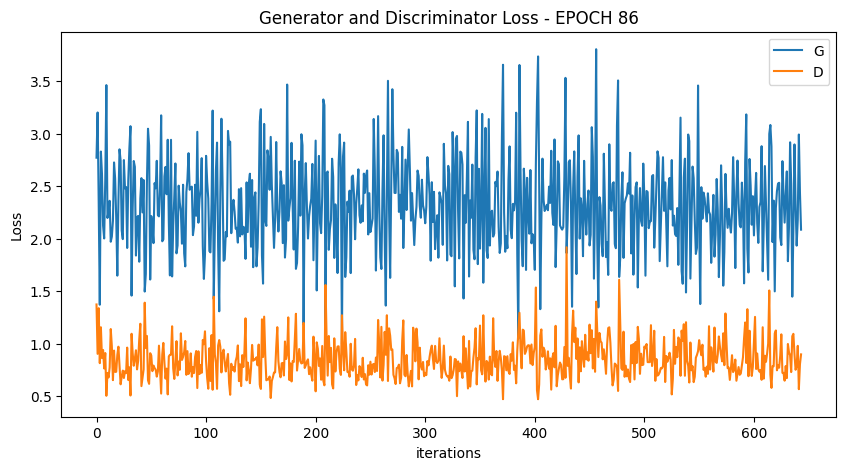

  0%|          | 0/644 [00:00<?, ?it/s]

[88/100][322/644] Loss_D: 1.4730 Loss_G: 1.6014 D(x): 0.3026 D(G(z)): 0.0943 / 0.2281
[88/100][644/644] Loss_D: 1.0102 Loss_G: 2.6149 D(x): 0.4648 D(G(z)): 0.1002 / 0.0679


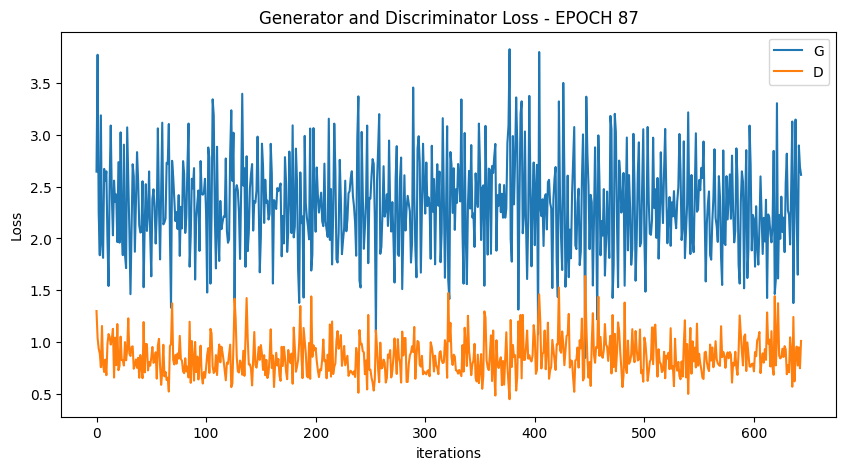

  0%|          | 0/644 [00:00<?, ?it/s]

[89/100][322/644] Loss_D: 0.7795 Loss_G: 3.3441 D(x): 0.8029 D(G(z)): 0.2714 / 0.0410
[89/100][644/644] Loss_D: 0.7803 Loss_G: 5.1734 D(x): 0.6087 D(G(z)): 0.1937 / 0.0138


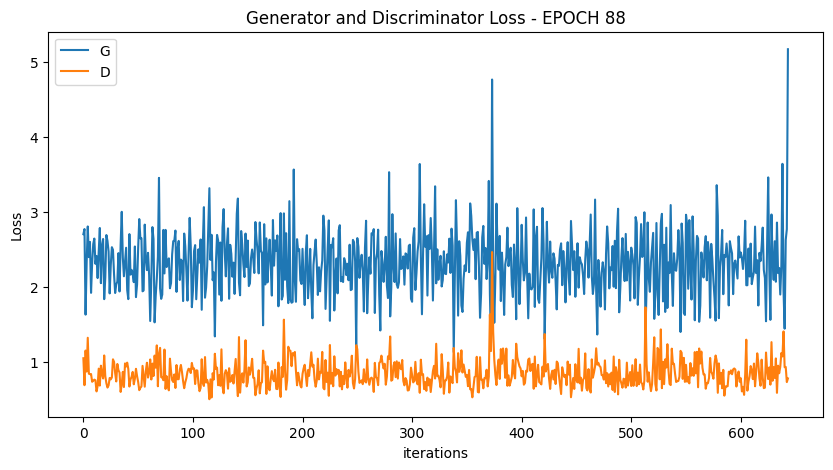

  0%|          | 0/644 [00:00<?, ?it/s]

[90/100][322/644] Loss_D: 0.7443 Loss_G: 1.9843 D(x): 0.6703 D(G(z)): 0.1692 / 0.1484
[90/100][644/644] Loss_D: 0.8017 Loss_G: 3.6605 D(x): 0.5713 D(G(z)): 0.1281 / 0.0180


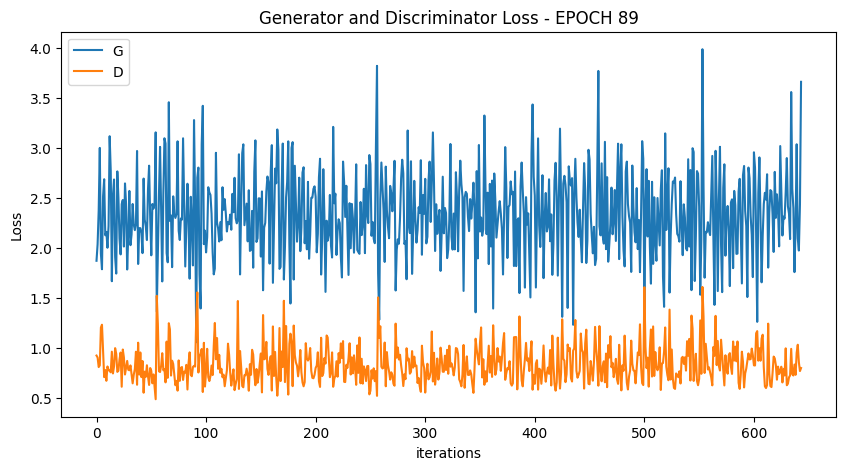

  0%|          | 0/644 [00:00<?, ?it/s]

[91/100][322/644] Loss_D: 0.7577 Loss_G: 3.0362 D(x): 0.9303 D(G(z)): 0.2985 / 0.0431
[91/100][644/644] Loss_D: 0.6354 Loss_G: 3.3389 D(x): 0.7285 D(G(z)): 0.1416 / 0.0262


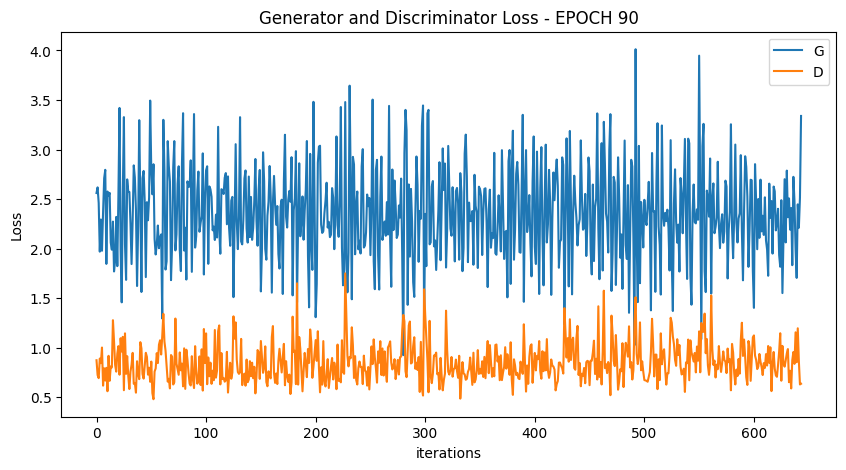

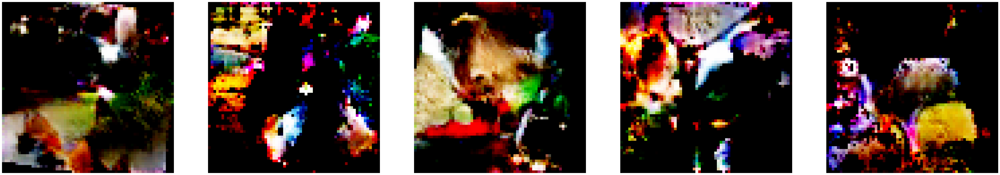

  0%|          | 0/644 [00:00<?, ?it/s]

[92/100][322/644] Loss_D: 0.7570 Loss_G: 2.2158 D(x): 0.7482 D(G(z)): 0.2155 / 0.1074
[92/100][644/644] Loss_D: 0.8853 Loss_G: 1.8130 D(x): 0.4294 D(G(z)): 0.0189 / 0.1428


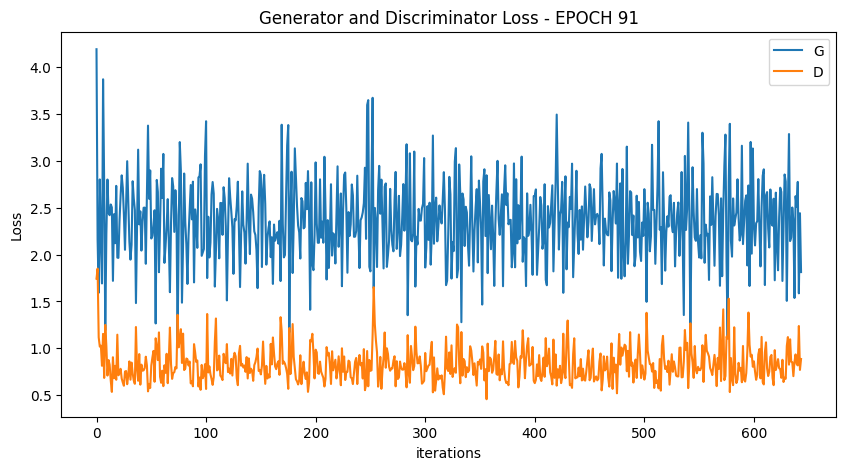

  0%|          | 0/644 [00:00<?, ?it/s]

[93/100][322/644] Loss_D: 1.1497 Loss_G: 1.2882 D(x): 0.4136 D(G(z)): 0.1461 / 0.2929
[93/100][644/644] Loss_D: 0.5031 Loss_G: 5.1355 D(x): 0.9550 D(G(z)): 0.1152 / 0.0034


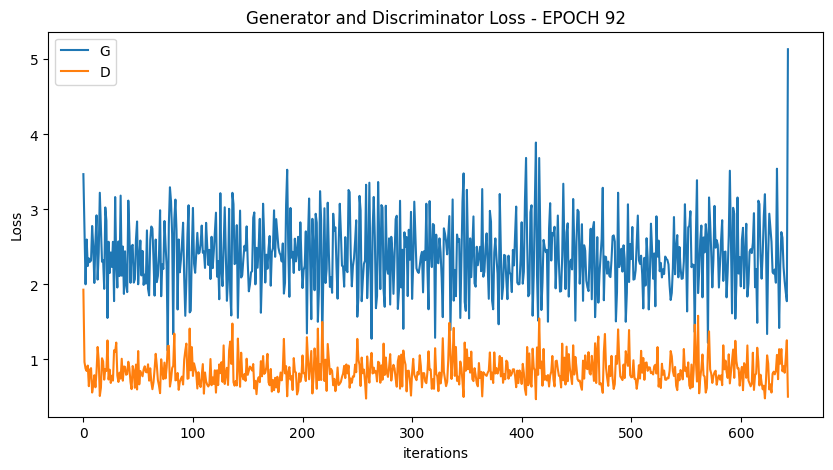

  0%|          | 0/644 [00:00<?, ?it/s]

[94/100][644/644] Loss_D: 1.3605 Loss_G: 7.5471 D(x): 0.7972 D(G(z)): 0.3460 / 0.0008


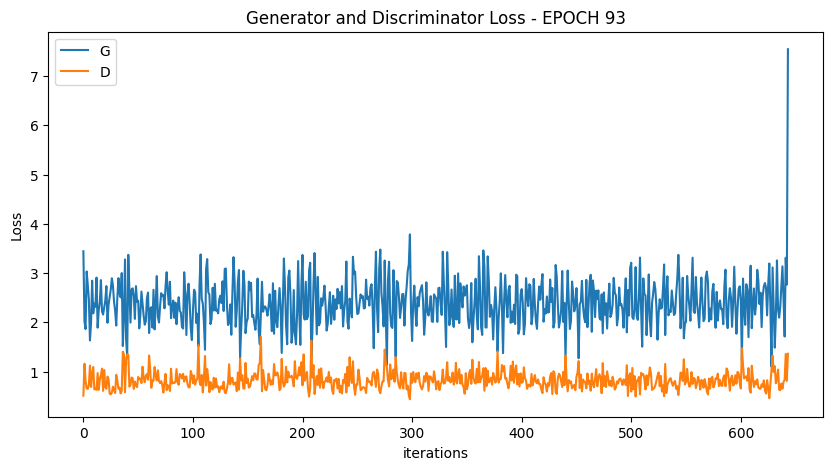

  0%|          | 0/644 [00:00<?, ?it/s]

[95/100][322/644] Loss_D: 1.1879 Loss_G: 2.0027 D(x): 0.5035 D(G(z)): 0.2511 / 0.1599
[95/100][644/644] Loss_D: 1.3383 Loss_G: 2.1686 D(x): 0.2531 D(G(z)): 0.0143 / 0.0929


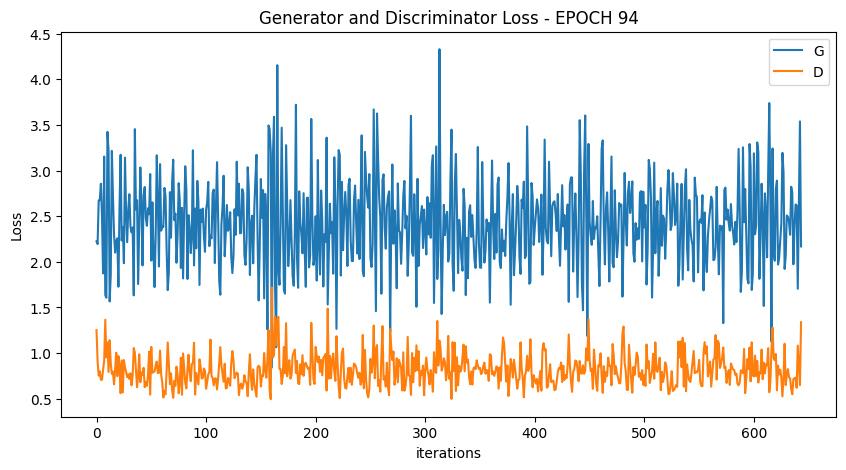

  0%|          | 0/644 [00:00<?, ?it/s]

[96/100][322/644] Loss_D: 0.8347 Loss_G: 2.0461 D(x): 0.5264 D(G(z)): 0.0754 / 0.1366
[96/100][644/644] Loss_D: 0.8233 Loss_G: 2.9303 D(x): 0.5440 D(G(z)): 0.1023 / 0.0441


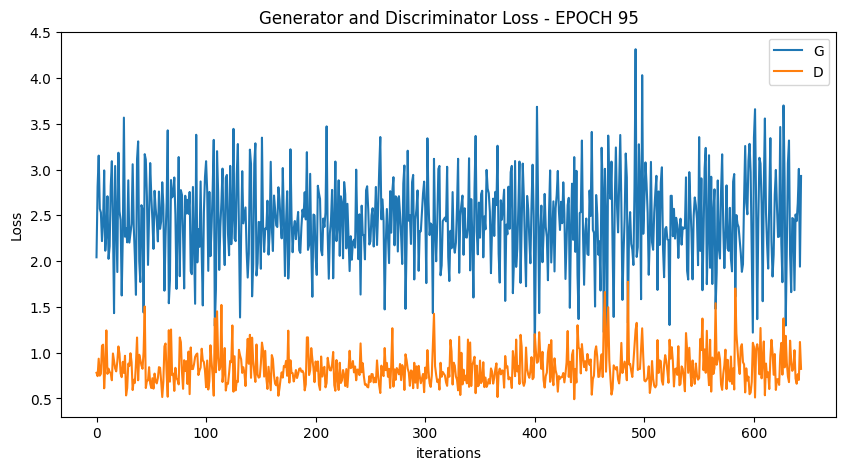

  0%|          | 0/644 [00:00<?, ?it/s]

[97/100][322/644] Loss_D: 0.6765 Loss_G: 2.7104 D(x): 0.9120 D(G(z)): 0.2337 / 0.0623
[97/100][644/644] Loss_D: 0.4700 Loss_G: 4.0092 D(x): 0.8075 D(G(z)): 0.0648 / 0.0121


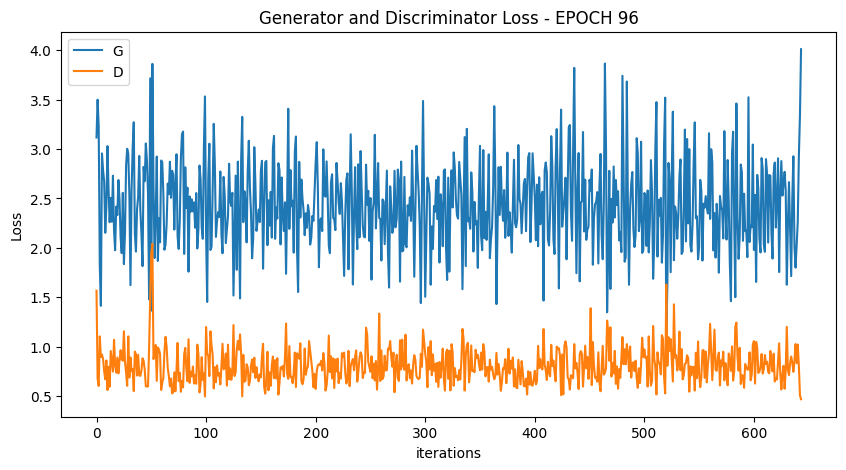

  0%|          | 0/644 [00:00<?, ?it/s]

[98/100][322/644] Loss_D: 0.8801 Loss_G: 2.3339 D(x): 0.7445 D(G(z)): 0.3104 / 0.0976
[98/100][644/644] Loss_D: 1.3973 Loss_G: 3.1330 D(x): 0.3995 D(G(z)): 0.1100 / 0.0327


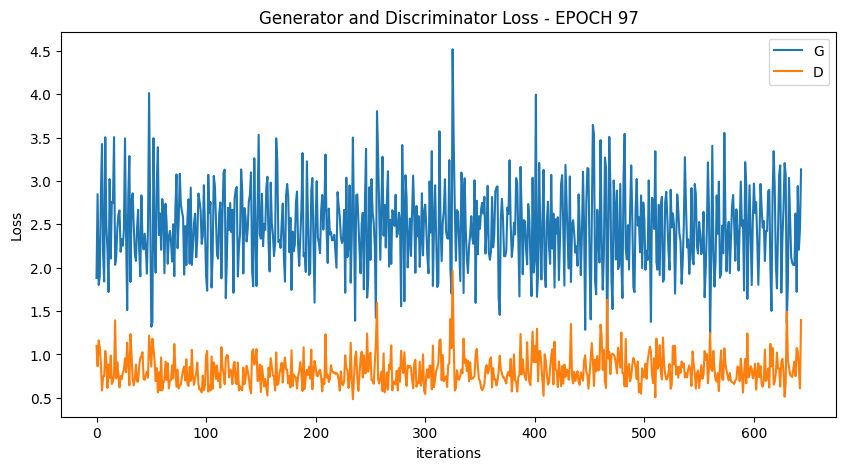

  0%|          | 0/644 [00:00<?, ?it/s]

[99/100][322/644] Loss_D: 0.9714 Loss_G: 1.8443 D(x): 0.5572 D(G(z)): 0.1581 / 0.1623
[99/100][644/644] Loss_D: 0.4355 Loss_G: 3.5146 D(x): 0.7906 D(G(z)): 0.0305 / 0.0252


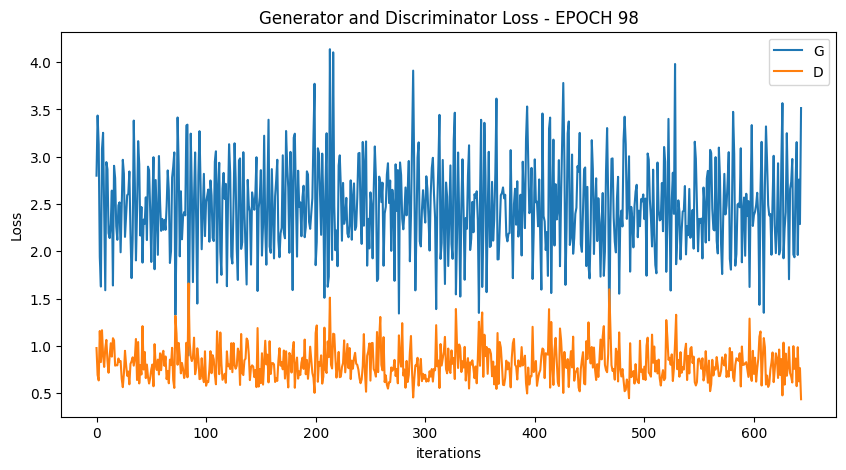

  0%|          | 0/644 [00:00<?, ?it/s]

[100/100][322/644] Loss_D: 0.5497 Loss_G: 2.5041 D(x): 0.8519 D(G(z)): 0.1255 / 0.0800
[100/100][644/644] Loss_D: 1.4238 Loss_G: 9.8650 D(x): 0.7267 D(G(z)): 0.4867 / 0.0004


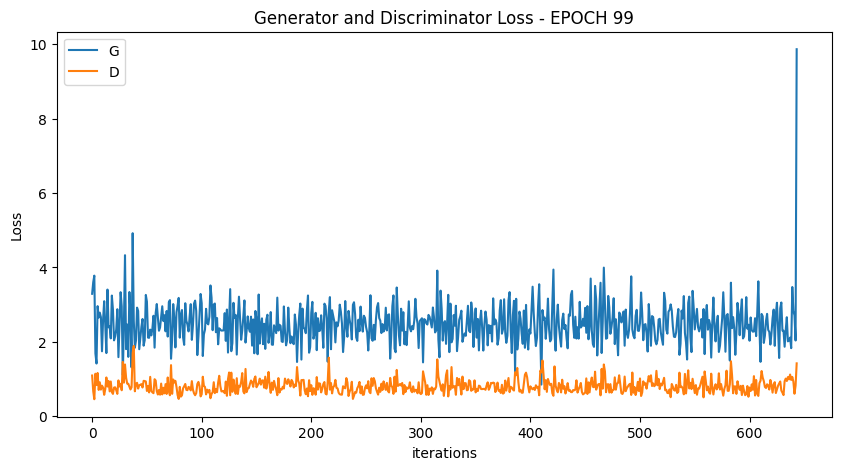

In [ ]:
for epoch in range(epochs):

    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)

#             valid_image = netG(fixed_noise)

In [ ]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  107.02333976984023


# Generation example


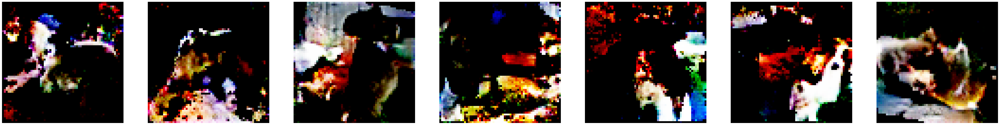

In [ ]:
show_generated_img(7)

In [ ]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')

im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

/tmp/ipykernel_32/2441337517.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i_batch in tqdm(range(0, n_images, im_batch_size)):


  0%|          | 0/200 [00:00<?, ?it/s]

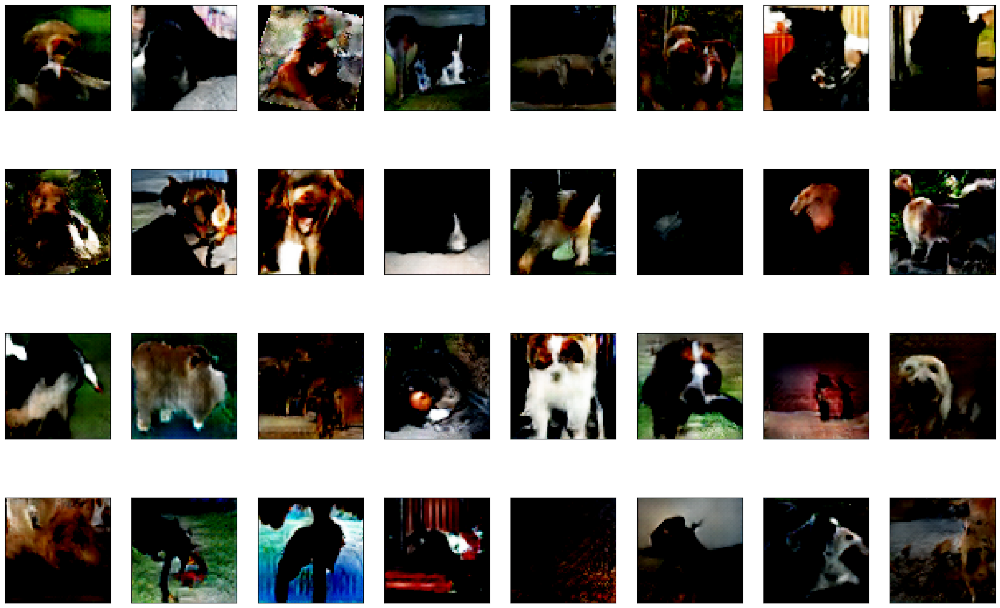

In [ ]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)